# 3장. 비지도 학습과 데이터 전처리

In [2]:
!pip3 install koreanize_matplotlib 
# 한글 폰트 해결 


[notice] A new release of pip is available: 24.1.2 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
%pip install matplotlib


[notice] A new release of pip is available: 24.1.2 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import sklearn
from preamble import * #preamble.py에 import koreanize_matplotlib를 추가하니 한글 문제 해결됨
import matplotlib


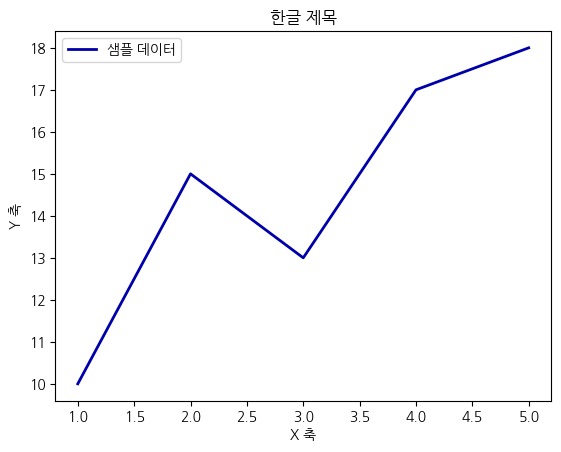

In [5]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
### 네이버 나눔글꼴 다운로드 페이지에서 다운로드 > 압축풀고 > font_path를 지정한다 
# 나눔 폰트 경로 설정
#font_path = 'C:\\Users\\bhhong\\Documents\\K-Digital Training 훈련기관 정보\\nanum-all\\나눔 글꼴\\나눔바른고딕\\NanumFontSetup_TTF_BARUNGOTHIC\\NanumBarunGothic.ttf'  # 설치된 폰트의 경로로 변경하세요
#fontprop = fm.FontProperties(fname=font_path)
plt.rc('font', family='NanumGothic')
# 데이터 생성
x = [1, 2, 3, 4, 5]
y = [10, 15, 13, 17, 18]

# 그래프 그리기
plt.plot(x, y, label='샘플 데이터')

# 제목과 레이블 설정
plt.title('한글 제목')
plt.xlabel('X 축')
plt.ylabel('Y 축')

# 범례 설정
plt.legend()

In [6]:
from sklearn import datasets
from preamble import *
import matplotlib
import matplotlib.pyplot as plt

# 나눔 폰트를 사용합니다.
matplotlib.rc('font', family='NanumBarunGothic')
matplotlib.rcParams['axes.unicode_minus'] = False

# imshow 함수로 흑백 이미지를 출력하기 위해
plt.rcParams['image.cmap'] = "gray"

## 3.1 비지도 학습의 종류
- 비지도 변환(unsupervised transformation)
  
  > 원래 데이터를 보다 쉽게 해석할 수 있도록 만드는 알고리즘

  > 특성이 많은 고차원 데이터를 특성 수를 줄인 저차원 데이터로 표현하는 차원 축소(dimensionality reduction)
  
  > 데이터를 구성하는 성분 찾기: 텍스트 문서에서 주제 찾기

- 군집(clustering)

  > 데이터를 비슷한 것끼리 그룹으로 묶는 것


## 3.2 비지도 학습의 도전 과제

- 비지도 학습의 가장 어려운일: 레이블이 없는 데이터에 대한 군집 분류가 올바른지 판단이 어렵다

- 비지도 학습 알고리즘의 용도: 데이터를 더 잘 이해하고 싶을 때 탐색적 분석 단계에서 사용

  > 지도 학습의 전처리 단계에서도 사용


## 3.3 데이터 전처리와 스케일링
- 사용이유: 신경망, SVM은 데이터 스케일에 민감

In [7]:
%pip install mglearn


[notice] A new release of pip is available: 24.1.2 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


### 3.3.1 여러 가지 전처리 방법
- 특성1(x축): 10 ~ 15

- 특성2(y축): 1 ~ 9

- StandardScaler: 평균 0, 분산 1 >최대, 최소 값 범위를 제한하지 않는다

- RobustScaler: 특성들이 같은 스케일을 갖게 한다 > 평균, 분산 대신에 median, quartile 값을 사용 >outlier에 영향 받지 않는다
  > 188페이지 첫째 문단 

- MinMaxScaler: 모든 특성이 0 ~ 1 사이에 위치

- Nomalizer: 특성 벡터의 유클리디안 길이가 1이 되게 데이터 포인트를 조정 > 지름 1인 원에 데이터 포인트 배치 > 길이는 무시하고 방향만 고려할 때 사용

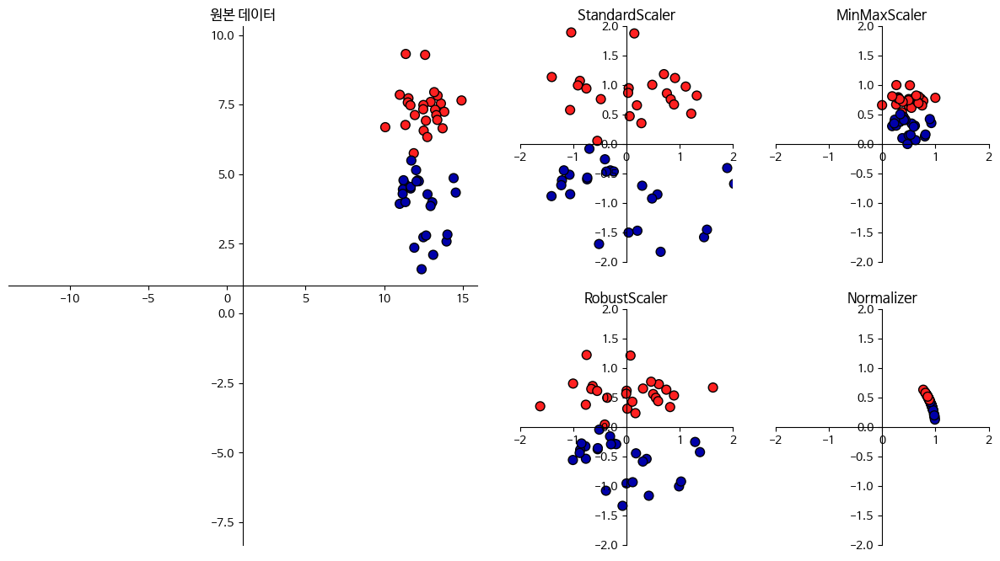

In [8]:
import mglearn
mglearn.plots.plot_scaling()

### 3.3.2 데이터 변환 적용하기
- cancer 데이터세트에 적용
  1) MinMaxScaler 변환후

  2) SVM 적용

In [9]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=1)
print(X_train.shape) # 데이터 포인트 569개, 특성은 30개
print(X_test.shape)

(426, 30)
(143, 30)


In [10]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler() # 객체 생성

In [ ]:
scaler.fit(X_train) # 이 메소드는 훈련세트에 있는 최대값과 최소값을 계산
# 학습 데이터에서 변환에 필요한 통계값만 계산
# 예: MinMaxScaler.fit()은 **최소값(min), 최대값(max)**을 저장

MinMaxScaler()

In [14]:
# 데이터 변환
X_train_scaled = scaler.transform(X_train)#fit 메소드로 학습한 변환을 적용 > 훈련 데이터의 스케일을 조정
# 스케일이 조정된 후 데이터셋의 속성을 출력합니다
print("변환된 후 크기:", X_train_scaled.shape)
print("스케일 조정 전 특성별 최소값:\n", X_train.min(axis=0))
print("스케일 조정 전 특성별 최대값:\n", X_train.max(axis=0))
print("스케일 조정 후 특성별 최소값:\n", X_train_scaled.min(axis=0))
print("스케일 조정 후 특성별 최대값:\n", X_train_scaled.max(axis=0))

변환된 후 크기: (426, 30)
스케일 조정 전 특성별 최소값:
 [  6.981   9.71   43.79  143.5     0.053   0.019   0.      0.      0.106
   0.05    0.115   0.36    0.757   6.802   0.002   0.002   0.      0.
   0.01    0.001   7.93   12.02   50.41  185.2     0.071   0.027   0.
   0.      0.157   0.055]
스케일 조정 전 특성별 최대값:
 [  28.11    39.28   188.5   2501.       0.163    0.287    0.427    0.201
    0.304    0.096    2.873    4.885   21.98   542.2      0.031    0.135
    0.396    0.053    0.061    0.03    36.04    49.54   251.2   4254.
    0.223    0.938    1.17     0.291    0.577    0.149]
스케일 조정 후 특성별 최소값:
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
스케일 조정 후 특성별 최대값:
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


In [ ]:
# 테스트 데이터 변환
X_test_scaled = scaler.transform(X_test)
# 스케일이 조정된 후 테스트 데이터의 속성을 출력합니다
print("스케일 조정 후 특성별 최소값:\n", X_test_scaled.min(axis=0)) # 0 ~ 1 범위를 벗어남 > 마이너스 값
print("스케일 조정 후 특성별 최대값:\n", X_test_scaled.max(axis=0))
# 항상 훈련 세트와 테스트 세트에 같은 변환 적용해야 한다 > 테스트 세트에 대한 스케일 조정 공식: 191페이지 주석6

스케일 조정 후 특성별 최소값:
 [ 0.034  0.023  0.031  0.011  0.141  0.044  0.     0.     0.154 -0.006
 -0.001  0.006  0.004  0.001  0.039  0.011  0.     0.    -0.032  0.007
  0.027  0.058  0.02   0.009  0.109  0.026  0.     0.    -0.    -0.002]
스케일 조정 후 특성별 최대값:
 [0.958 0.815 0.956 0.894 0.811 1.22  0.88  0.933 0.932 1.037 0.427 0.498
 0.441 0.284 0.487 0.739 0.767 0.629 1.337 0.391 0.896 0.793 0.849 0.745
 0.915 1.132 1.07  0.924 1.205 1.631]


### 3.3.4 훈련 데이터와 테스트 데이터의 스케일을 같은 방법으로 조정하기

In [11]:
%pip install matplotlib
import matplotlib.pyplot as plt

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib as mpl
import mglearn

# 나눔 폰트를 사용합니다.
mpl.rc('font', family='NanumBarunGothic')
mpl.rcParams['axes.unicode_minus'] = False

# imshow 함수로 흑백 이미지를 출력하기 위해
plt.rcParams['image.cmap'] = "gray"

### 지도학습모델에서 훈련세트와 테스트세트에 같은 변환을 적용해야 한다

- 테스트 세트의 스케일을 다른 방식으로 조정 > 그림 3-2(우측) 200페이지 두번째, 세번째 문단 

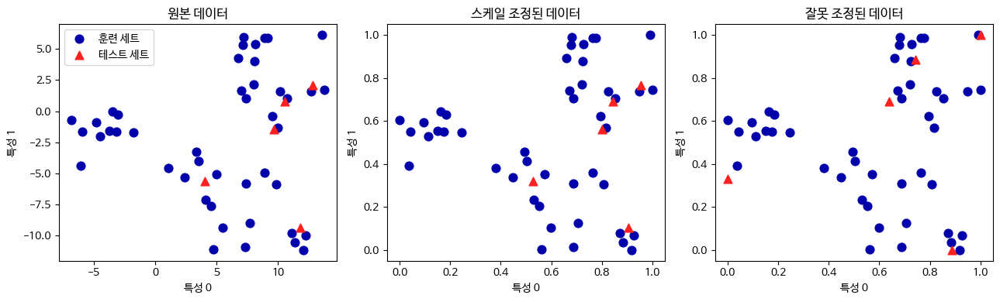

In [12]:
from sklearn.datasets import make_blobs
# 인위적인 데이터셋 생성
X, _ = make_blobs(n_samples=50, centers=5, random_state=4, cluster_std=2)
# 훈련 세트와 테스트 세트로 나눕니다
X_train, X_test = train_test_split(X, random_state=5, test_size=.1)

### 원본 데이터 ###
# 훈련 세트와 테스트 세트의 산점도를 그립니다
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].scatter(X_train[:, 0], X_train[:, 1],
                c=mglearn.cm2.colors[0], label="훈련 세트", s=60)
axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
                c=mglearn.cm2.colors[1], label="테스트 세트", s=60)
axes[0].legend(loc='upper left')
axes[0].set_title("원본 데이터")

### 스케일 조정된 데이터 ####
# MinMaxScaler를 사용해 스케일을 조정합니다
scaler = MinMaxScaler()
scaler.fit(X_train) #훈련데이터로 변환 학습
X_train_scaled = scaler.transform(X_train) # 학습된 변환을 훈련 데이터 적용
X_test_scaled = scaler.transform(X_test) # 학습된 변환을 테스트 데이터 적용

# 스케일이 조정된 데이터의 산점도를 그립니다
axes[1].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2.colors[0], label="훈련 세트", s=60)
axes[1].scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], marker='^',
                c=mglearn.cm2.colors[1], label="테스트 세트", s=60)
axes[1].set_title("스케일 조정된 데이터")

### 잘못 조정된 데이터 변환
# 테스트 세트의 스케일을 따로 조정합니다
# 테스트 세트의 최솟값은 0, 최댓값은 1이 됩니다
# 이는 예제를 위한 것으로 절대로 이렇게 사용해서는 안됩니다
test_scaler = MinMaxScaler()
test_scaler.fit(X_test) #테스트 데이터로 학습
X_test_scaled_badly = test_scaler.transform(X_test) # 테스트 데이터로 학습된 변환을 테스트 데이터 적용

# 잘못 조정된 데이터의 산점도를 그립니다
axes[2].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1], # 훈련데이터 변환은 2번째 방법으로 변환한 것임
                c=mglearn.cm2.colors[0], label="training set", s=60)
axes[2].scatter(X_test_scaled_badly[:, 0], X_test_scaled_badly[:, 1],
                marker='^', c=mglearn.cm2.colors[1], label="test set", s=60)
axes[2].set_title("잘못 조정된 데이터")

for ax in axes:
    ax.set_xlabel("특성 0")
    ax.set_ylabel("특성 1")
fig.tight_layout()

In [13]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# 메소드 체이닝(chaining)을 사용하여 fit과 transform을 연달아 호출합니다
X_scaled = scaler.fit(X_train).transform(X_train)
# 위와 동일하지만 더 효율적입니다
X_scaled_d = scaler.fit_transform(X_train)

### 3.3.5 지도 학습에서 데이터 전처리 효과

In [14]:
from sklearn.svm import SVC

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=0)

svm = SVC(gamma='auto')
svm.fit(X_train, y_train)
print("테스트 세트 정확도: {:.2f}".format(svm.score(X_test, y_test)))

테스트 세트 정확도: 0.63


In [20]:
# 0~1 사이로 스케일 조정
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 조정된 데이터로 SVM 학습
svm.fit(X_train_scaled, y_train)

# 스케일 조정된 테스트 세트의 정확도
print("스케일 조정된 테스트 세트의 정확도: {:.2f}".format(svm.score(X_test_scaled, y_test)))

스케일 조정된 테스트 세트의 정확도: 0.95


In [15]:
# 평균 0, 분산 1을 갖도록 스케일 조정
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 조정된 데이터로 SVM 학습
svm.fit(X_train_scaled, y_train)

# 스케일 조정된 테스트 세트의 정확도
print("SVM 테스트 정확도: {:.2f}".format(svm.score(X_test_scaled, y_test)))

SVM 테스트 정확도: 0.97


## 3.4 차원 축소, 특성 추출, 매니폴드 학습
- 비지도 학습을 사용해 데이터 변환하는 이유:
  
   > 시각화 및 해석 용이: t-SNE, UMAP으로 고차원 데이터를 2D, 3D로 변환해 패턴을 눈으로 확인

   > 차원 축소(Dimensionality Reduction): 불필요한 중복, 잡음 줄여 핵심 정보만 압축 표현
      * 주성분 분석

   > 정보가 더 잘 드러나는 표현을 찾기 위함 (구조 발견)
      군집 결과를 새로운 범주형 특성으로 추가
      * 비음수 행렬 분해

### 3.4.1 주성분 분석 (PCA)

- 특성들이 통계적으로 상관관계가 없도록 데이터세트를 회전시키는 기술
  
  > 주성분1,2를 각각 x축, y축에 나란하도록 회전

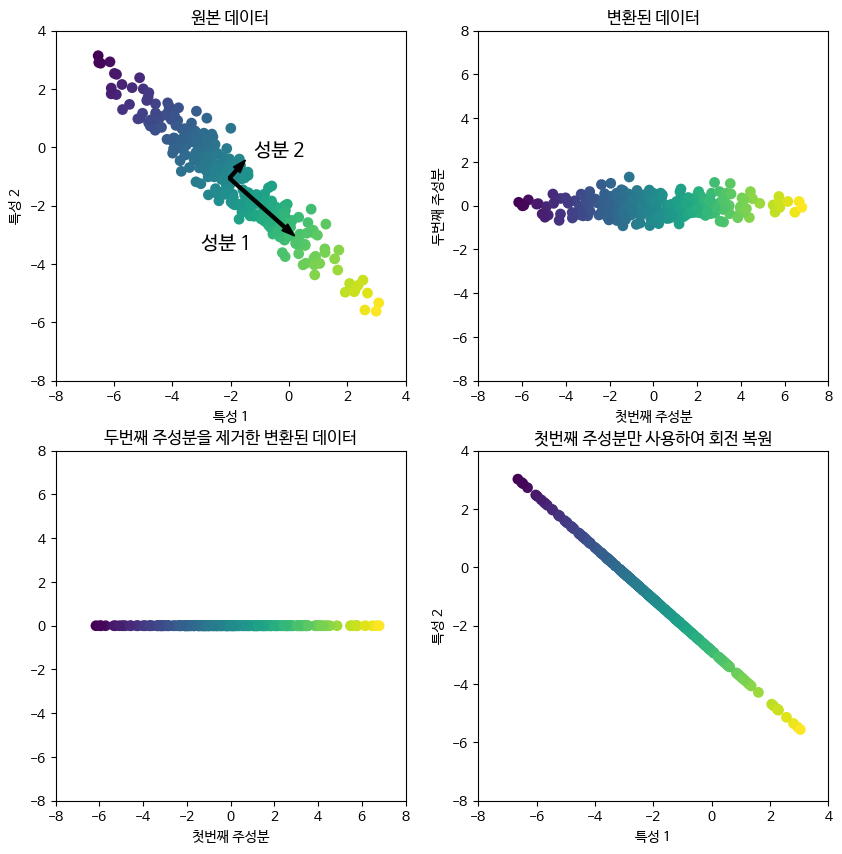

In [17]:
mglearn.plots.plot_pca_illustration()
# 두번째 주성분 제거 > 차원 축소

#### PCA 적용해 유방암 데이터셋 시각화하기

- PCA의 가장 널리 사용되는 분야: 고차원 데이터세트의 시각화 

  > 페이지 46: iris 데이터세트의 산점도 분포

  > 207페이지 cancer 데이터세트는 산점도 행렬 적용이 어렵다 > 데이터세트 특성이 30개 > 30 x 14.5 = 435개의 산점도
    
    * 대안: 30개 특성에 대한 양성, 음성의 히스토그램

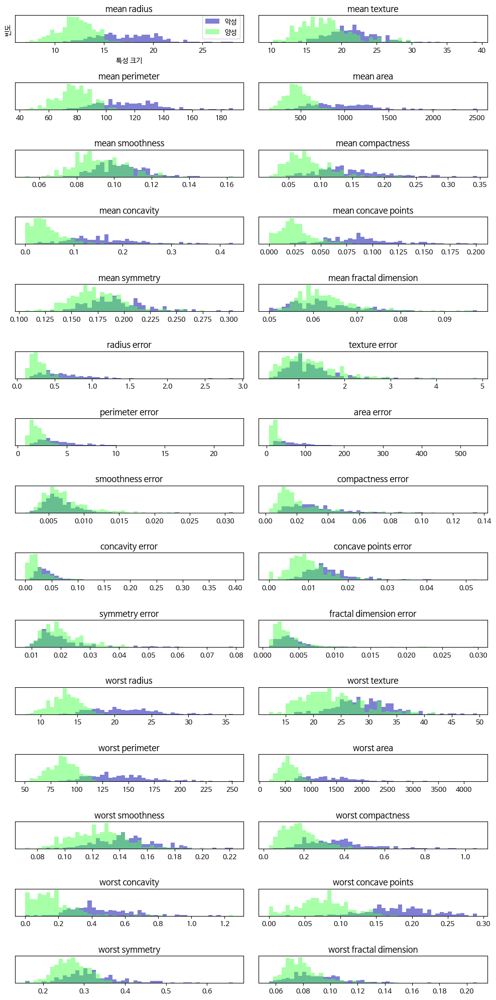

In [18]:
import numpy as np
fig, axes = plt.subplots(15, 2, figsize=(10, 20))
malignant = cancer.data[cancer.target == 0]
benign = cancer.data[cancer.target == 1]

ax = axes.ravel()

for i in range(30):
    _, bins = np.histogram(cancer.data[:, i], bins=50)
    ax[i].hist(malignant[:, i], bins=bins, color=mglearn.cm3(0), alpha=.5)
    ax[i].hist(benign[:, i], bins=bins, color=mglearn.cm3(2), alpha=.5)
    ax[i].set_title(cancer.feature_names[i])
    ax[i].set_yticks(())
ax[0].set_xlabel("특성 크기")
ax[0].set_ylabel("빈도")
ax[0].legend(["악성", "양성"], loc="best")
fig.tight_layout()

- 어떤 특성이 양성, 음성 클래스를 구분하는 데 더 좋은지 시각화한다

  > smoothness error는 겹쳐서 쓸모없는 특성

  > worst concave points는 두 개 클래스를 잘 구분하는 유용한 특성

  > 산점도 히스토그램은 특성 간의 상호 작용 또는 이 상호작용이 2개 클래스 구분하는 데 어떤 관련이 있는지 알려주지 못한다.
   
    >> 2개 이상의 특성들이 2개 클래스(양성, 음성)를 구분하는지를 파악할 수가 없다 

    >>PCA는 2개 클래스를 잘 구분할 수 있는 주성분을 찾아준다 > 주성분은 한개 이상의 특성들로 구성

In [16]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()

scaler = StandardScaler()
scaler.fit(cancer.data)
X_scaled = scaler.transform(cancer.data)

In [17]:
from sklearn.decomposition import PCA
# 데이터의 처음 두 개 주성분만 유지시킵니다
pca = PCA(n_components=2)
# 유방암 데이터로 PCA 모델을 만듭니다
pca.fit(X_scaled) # 학습하는 것은 주성분을 찾는 것이다 - 회전축을 찾을 때 어떤 클래스 정보도 사용하지 않는다 

# 처음 두 개의 주성분을 사용해 데이터를 변환합니다
X_pca = pca.transform(X_scaled) # 데이터 변환하고 차원을 축소한다 
print("원본 데이터 형태:", str(X_scaled.shape))
print("축소된 데이터 형태:", str(X_pca.shape))

원본 데이터 형태: (569, 30)
축소된 데이터 형태: (569, 2)


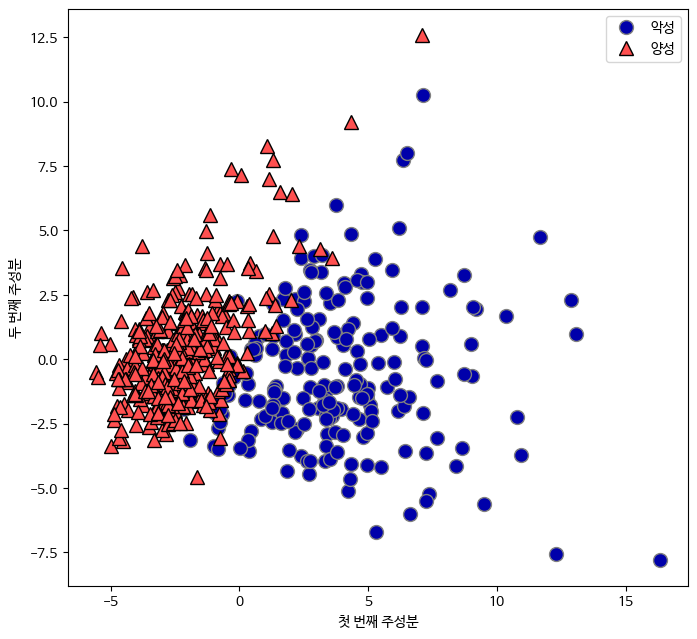

In [27]:
# 클래스를 색깔로 구분하여 처음 두 개의 주성분을 그래프로 나타냅니다.
plt.figure(figsize=(8, 8))
mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], cancer.target)
plt.legend(["악성", "양성"], loc="best")
plt.gca().set_aspect("equal")
plt.xlabel("첫 번째 주성분")
plt.ylabel("두 번째 주성분")
plt.show() # 책에는 없음

- PCA 단점: 주성분 2축을 해석하기가 어렵다 > 주성분은 여러 특성이 조합된 형태

  > pca.fit(X_scaled) pca객체가 학습될 때 components_ 속성에 주성분이 저장된다 > 210페이지 두번째 문단 

In [28]:
print("PCA 주성분 형태:", pca.components_.shape)

PCA 주성분 형태: (2, 30)


In [30]:
print("PCA 주성분:", pca.components_)

PCA 주성분: [[ 0.219  0.104  0.228  0.221  0.143  0.239  0.258  0.261  0.138  0.064
   0.206  0.017  0.211  0.203  0.015  0.17   0.154  0.183  0.042  0.103
   0.228  0.104  0.237  0.225  0.128  0.21   0.229  0.251  0.123  0.132]
 [-0.234 -0.06  -0.215 -0.231  0.186  0.152  0.06  -0.035  0.19   0.367
  -0.106  0.09  -0.089 -0.152  0.204  0.233  0.197  0.13   0.184  0.28
  -0.22  -0.045 -0.2   -0.219  0.172  0.144  0.098 -0.008  0.142  0.275]]


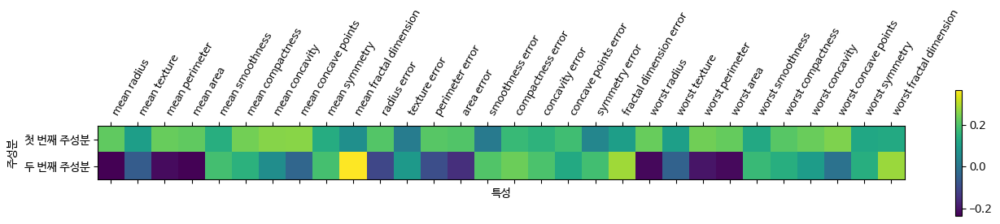

In [31]:
plt.matshow(pca.components_, cmap='viridis')
plt.yticks([0, 1], ["첫 번째 주성분", "두 번째 주성분"])
plt.colorbar()
plt.xticks(range(len(cancer.feature_names)),
           cancer.feature_names, rotation=60, ha='left')
plt.xlabel("특성")
plt.ylabel("주성분")
plt.show() # 책에는 없음

#### 고유얼굴(eigenface) 특성 추출
- eigen(독일어로 고유한(own, proper), 1920-30년대)

  > 특정 선형변환에 대해서 변하지 않는(방향이 변하지 않는) 벡터와 그에 대응하는 비율

    A v = 람다 v 여기서 람다: eigenvalue, v는 eigenvector

     행렬 A를 v  백터로 변환할 때 자기만의 변화를 유지하는 고유값: 람다

구글링: 고윳값과 고유벡터 - 공돌이의 수학정리노트 (Angelo's Math ...,공돌이의 수학정리노트 (Angelo's Math Notes),https://angeloyeo.github.io/2019/07/17/eigen_vector.html

- 고유벡터(Eigenvector) : 어떤 행렬(변환)을 적용했을 때 방향이 변하지 않는 벡터입니다. 크기는 바뀔 수 있지만 방향은 그대이다

- 고유값(Eigenvalue) : 그 고유벡터가 얼마나 늘어나거나 줄어드는지를 나타내는 비율(스칼라 값)이다 



- 얼굴이미지 100 x 100 > 10000 벡터

- 사람마다 얼굴 모양이 다르지만, 많은 사람 얼굴에는 공통된 패턴이 있습니다(눈, 코, 입 위치 등).

- 이 공통 패턴을 잘 표현하는 축을 찾는 것이 고유벡터의 역할

- 여러 사람의 얼굴 이미지를 벡터화해 행렬로 저장

- 행렬의 고유벡터 → 얼굴 데이터에서 가장 큰 변화를 설명하는 방향(특성).

- 고유값 → 해당 고유벡터(특성)가 데이터 변화를 얼마나 설명하는지 비율.

- 고유얼굴(Eigenfaces) 생성: 고유벡터를 다시 이미지 형태로 변환 → 흐릿하지만 얼굴 형태가 보임.

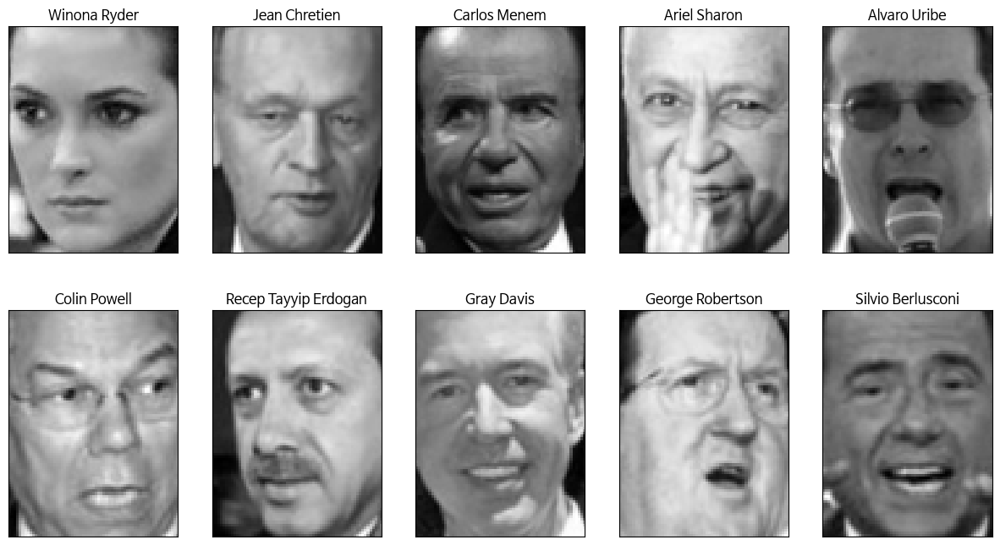

In [26]:
# LFW: Labeled faces in the Wild
from sklearn.datasets import fetch_lfw_people #얼굴이미지 데이터세트
people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
image_shape = people.images[0].shape

fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for target, image, ax in zip(people.target, people.images, axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])

In [20]:
print(type(people))

<class 'sklearn.utils._bunch.Bunch'>


In [21]:
people.target[0:10], people.target_names[people.target[0:10]]

(array([61, 25,  9,  5,  1, 10, 48, 17, 13, 54], dtype=int64),
 array(['Winona Ryder', 'Jean Chretien', 'Carlos Menem', 'Ariel Sharon',
        'Alvaro Uribe', 'Colin Powell', 'Recep Tayyip Erdogan',
        'Gray Davis', 'George Robertson', 'Silvio Berlusconi'],
       dtype='<U25'))

In [ ]:
# LFW 데이터세트

print("people.images.shape:", people.images.shape) #3023개의 이미지, 이미지 크기: (87,65)
print("클래스 개수:", len(people.target_names)) # 62명의 얼굴

people.images.shape: (3023, 87, 65)
클래스 개수: 62


In [23]:
import numpy as np

In [24]:
# 각 타깃이 나타난 횟수 계산
counts = np.bincount(people.target)
# 타깃별 이름과 횟수 출력
for i, (count, name) in enumerate(zip(counts, people.target_names)):
    print("{0:25} {1:3}".format(name, count), end='   ')
    if (i + 1) % 3 == 0:
        print()

Alejandro Toledo           39   Alvaro Uribe               35   Amelie Mauresmo            21   
Andre Agassi               36   Angelina Jolie             20   Ariel Sharon               77   
Arnold Schwarzenegger      42   Atal Bihari Vajpayee       24   Bill Clinton               29   
Carlos Menem               21   Colin Powell              236   David Beckham              31   
Donald Rumsfeld           121   George Robertson           22   George W Bush             530   
Gerhard Schroeder         109   Gloria Macapagal Arroyo    44   Gray Davis                 26   
Guillermo Coria            30   Hamid Karzai               22   Hans Blix                  39   
Hugo Chavez                71   Igor Ivanov                20   Jack Straw                 28   
Jacques Chirac             52   Jean Chretien              55   Jennifer Aniston           21   
Jennifer Capriati          42   Jennifer Lopez             21   Jeremy Greenstock          24   
Jiang Zemin                20 

In [27]:
# 데이터세트의 편중을 없애기 위해 50개 이미지만 선택
# np.bool은 1.20버전부터 deprecated됩니다. 대신 bool을 사용하세요.
mask = np.zeros(people.target.shape, dtype=bool)
for target in np.unique(people.target):
    mask[np.where(people.target == target)[0][:50]] = 1 #50개 이미지 선택

X_people = people.data[mask]
y_people = people.target[mask]

# 0~255 사이의 흑백 이미지의 픽셀 값을 0~1 사이로 스케일 조정합니다.
# (옮긴이) MinMaxScaler를 적용하는 것과 거의 동일합니다.
X_people = X_people / 255.

교재 215페이지 첫째 문단 이해

In [28]:
#주어진 얼굴과 가장 유사한 얼굴 찾기

from sklearn.neighbors import KNeighborsClassifier # 분류하려는 얼굴과 가장 비슷한 얼굴 이미지 찾는 모델 
# 데이터를 훈련 세트와 테스트 세트로 나눕니다
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0)
# 이웃 개수를 한 개로 하여 KNeighborsClassifier 모델을 만듭니다
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
print("1-최근접 이웃의 테스트 세트 점수: {:.2f}".format(knn.score(X_test, y_test))) # 정확도 23%

1-최근접 이웃의 테스트 세트 점수: 0.22


- PCA가 필요한 이유:

  > 얼굴 유사도 측정위해 원본 픽셀 공간에서 거리 계산 방법은 bad! > 각 픽셀 값 비교는 무리 >216페이지 두번째 문단

  > PCA의 whitening option: 차원 축소된 데이터에서 각 축(주성분)의 분산을 1로 통일하고 서로 직교 상태를 유지하도록 변환하는 과정

  > 그림 3-8



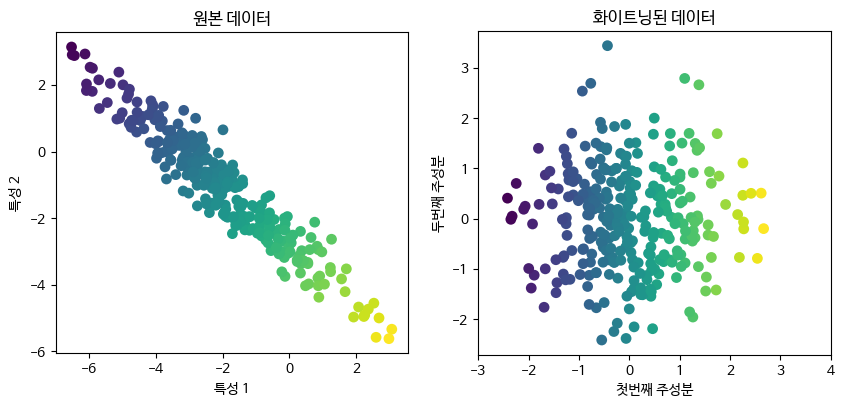

In [27]:
mglearn.plots.plot_pca_whitening() #PCA의 whitening 옵션 사용 - 주성분의 스케일이 같아지도록 조정
## standardScaler사용과 유사

In [29]:
pca = PCA(n_components=100, whiten=True, random_state=0).fit(X_train) # 100개의 주성분 추출
# whiten=True 매개변수를 주면 PCA 변환 과정에서 화이트닝(whitening) 을 적용
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print("X_train_pca.shape:", X_train_pca.shape) # 100개의 주성분

X_train_pca.shape: (1547, 100)


In [29]:
knn = KNeighborsClassifier(n_neighbors=1) # 100개의 주성분 데이터로 이미지 분류
knn.fit(X_train_pca, y_train) #주성분 분석 결과를 최근접 이웃분류기로 분류
print("테스트 세트 정확도: {:.2f}".format(knn.score(X_test_pca, y_test)))
# 23% -> 31% 향상 

테스트 세트 정확도: 0.30


- 주성분 표현: 입력 데이터 공간에서 어떤 방향

In [30]:
print("pca.components_.shape:", pca.components_.shape)# 100개의 주성분 -> 각 주성분은 87 x 65 pixel

pca.components_.shape: (100, 5655)


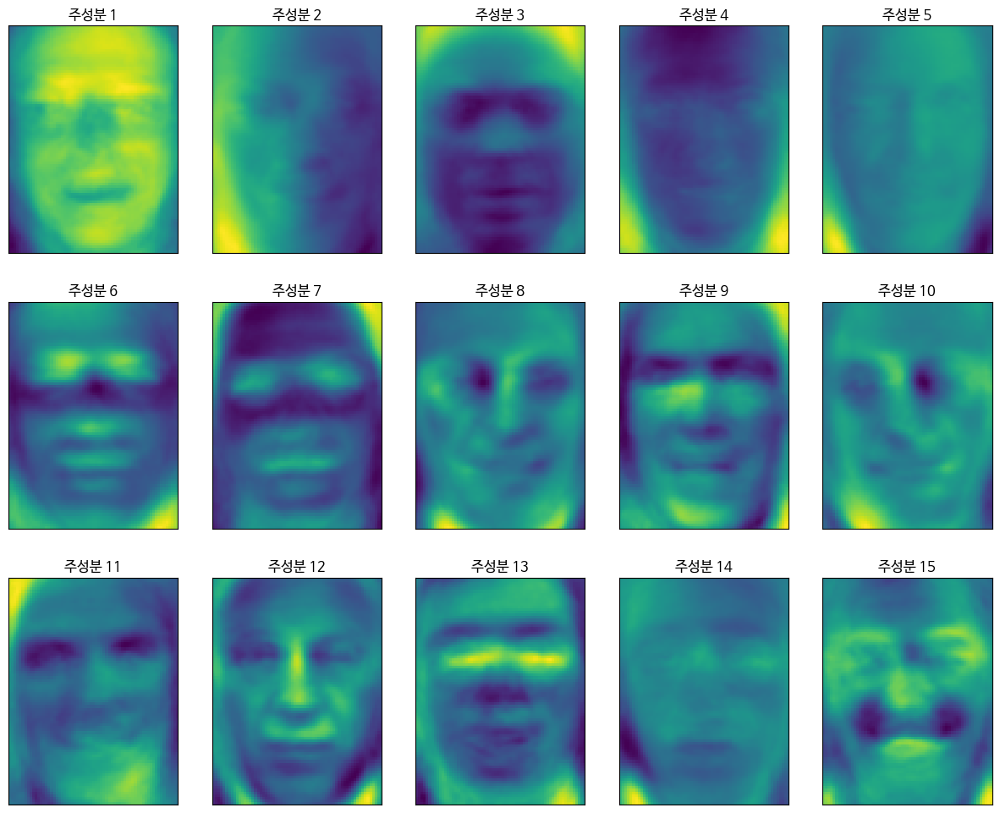

In [ ]:
# 이미지 주성분의 시각화

fig, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (component, ax) in enumerate(zip(pca.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape), cmap='viridis')
    ax.set_title("주성분 {}".format((i + 1)))
    # 교재 219페이지 첫번째 문단 설명 

주성분 시각화: 219페이지 첫째 문단 이해 

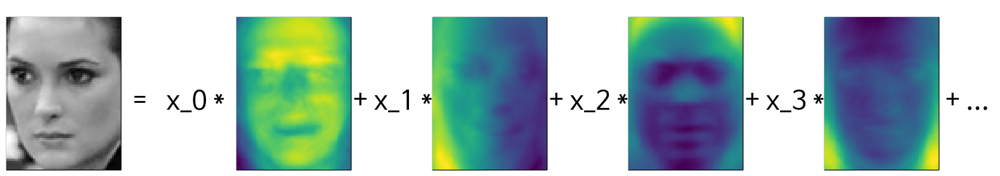

In [ ]:
# 주성분의 가중치 합으로 표현: 그림 3-10
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

image_shape = people.images[0].shape
plt.figure(figsize=(20, 3))
ax = plt.gca()

imagebox = OffsetImage(people.images[0], zoom=2, cmap="gray")
ab = AnnotationBbox(imagebox, (.05, 0.4), pad=0.0, xycoords='data')
ax.add_artist(ab)

for i in range(4):
    imagebox = OffsetImage(pca.components_[i].reshape(image_shape), zoom=2,
                           cmap="viridis")

    ab = AnnotationBbox(imagebox, (.285 + .2 * i, 0.4),
                        pad=0.0, xycoords='data')
    ax.add_artist(ab)
    if i == 0:
        plt.text(.155, .3, 'x_{} *'.format(i), fontdict={'fontsize': 30})
    else:
        plt.text(.145 + .2 * i, .3, '+ x_{} *'.format(i),
                 fontdict={'fontsize': 30})

plt.text(.95, .3, '+ ...', fontdict={'fontsize': 30})

plt.rc('text')
plt.text(.12, .3, '=', fontdict={'fontsize': 30})
plt.axis("off")
plt.show()
plt.close()
plt.rc('text')

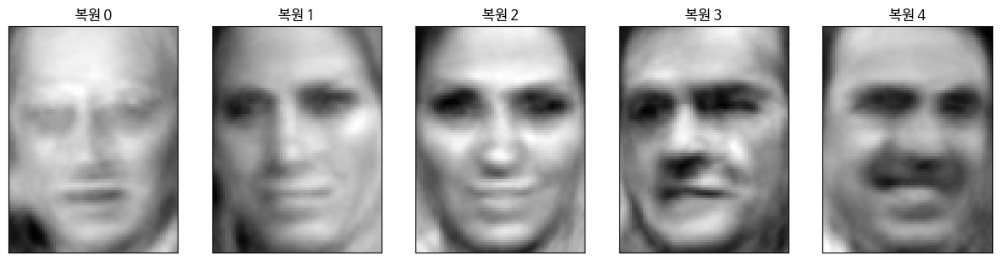

In [ ]:
# PCA 학습 및 변환
from sklearn.decomposition import PCA

pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# PCA 복원
X_test_back = pca.inverse_transform(X_test_pca) # 주성분을 사용하여 원래 특성 공간으로 복원

# 올바른 시각화
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 5, figsize=(15, 6),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, ax in enumerate(axes):
    ax.imshow(X_test_back[i].reshape(image_shape), cmap='gray')
    ax.set_title(f"복원 {i}")


mglearn.plots.plot_pca_faces() 내부:

- X_train으로 PCA(n_components=100) 학습
- X_test를 transform → inverse_transform
- 복원 이미지와 원본 이미지 몇 개를 .reshape(image_shape)로 비교 시각화



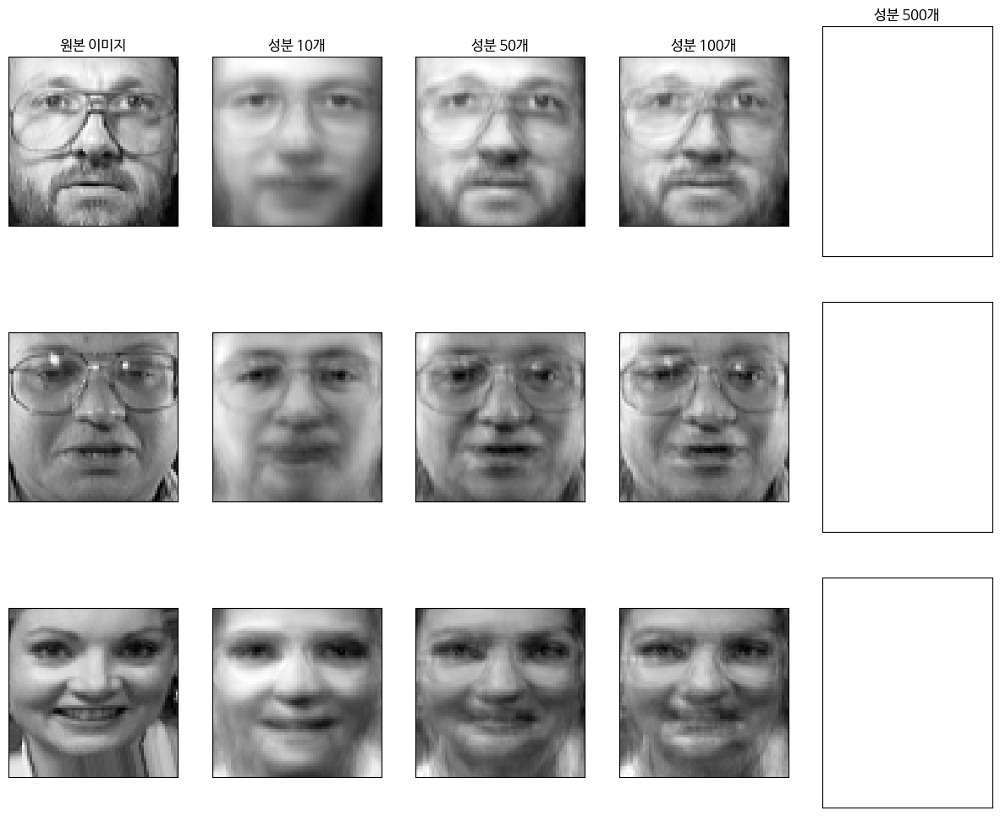

In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import mglearn

# Olivetti 얼굴 데이터셋을 로드합니다.
faces = fetch_olivetti_faces()

# 데이터를 훈련 세트와 테스트 세트로 나눕니다.
X_train, X_test, y_train, y_test = train_test_split(faces.data, faces.target, random_state=0)

# 이미지 모양을 설정합니다.
image_shape = faces.images[0].shape

# PCA로 변환된 얼굴 이미지 데이터를 시각화합니다.
mglearn.plots.plot_pca_faces(X_train, X_test, image_shape) 
# mglearn.plots.plot_pca_faces() 함수는 PCA된 데이터를 직접 넣으면 안 된다
#  함수는 내부에서 PCA를 수행하고 직접 .inverse_transform()까지 해주는 구조
plt.show()

- 주성분 10개 사용: 얼굴의 각도, 조명 등 기본 요소만
- 주성분 50개 이상 사용: 이미지가 더 상세해짐

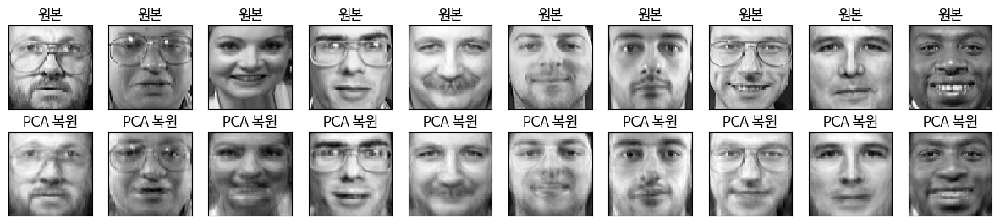

In [21]:
# 주성분으로 복원된 이미지 출력

import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

# Olivetti 얼굴 데이터셋을 로드합니다.
faces = fetch_olivetti_faces()

# 데이터를 훈련 세트와 테스트 세트로 나눕니다.
X_train, X_test, y_train, y_test = train_test_split(faces.data, faces.target, random_state=0)

# PCA를 사용하여 차원 축소를 수행합니다.
n_components = 100  # 주성분의 수를 100으로 설정
pca = PCA(n_components=n_components, whiten=True, random_state=0)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# 이미지 모양을 설정합니다.
image_shape = faces.images[0].shape

# PCA 변환된 데이터를 원래 이미지 공간으로 되돌립니다.
X_train_inverse = pca.inverse_transform(X_train_pca)
X_test_inverse = pca.inverse_transform(X_test_pca)

# 첫 번째 테스트 세트 이미지와 PCA 복원 이미지를 시각화합니다.
fig, axes = plt.subplots(2, 10, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# 원본 이미지를 시각화합니다.
for i in range(10):
    axes[0, i].imshow(X_test[i].reshape(image_shape), cmap='gray')
    axes[0, i].set_title("원본")

# PCA 복원 이미지를 시각화합니다.
for i in range(10):
    axes[1, i].imshow(X_test_inverse[i].reshape(image_shape), cmap='gray')
    axes[1, i].set_title("PCA 복원")

plt.show()

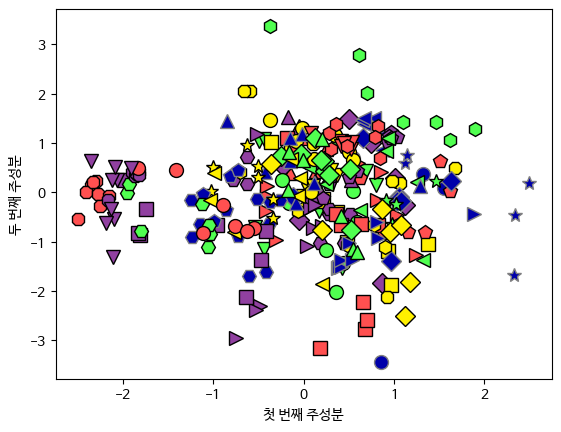

In [ ]:
# 2개의 주성분 사용하여 산포도 출력 > 덩어리 뭉쳐 있다

mglearn.discrete_scatter(X_train_pca[:, 0], X_train_pca[:, 1], y_train)
plt.xlabel("첫 번째 주성분")
plt.ylabel("두 번째 주성분")
plt.show() # 책에는 없음

#### 설명된 분산의 비율

In [41]:
np.sum(pca.explained_variance_ratio_) # 100개의 주성분으로 표현할 수 있는 얼굴데이터의 분산 94%

0.9444105

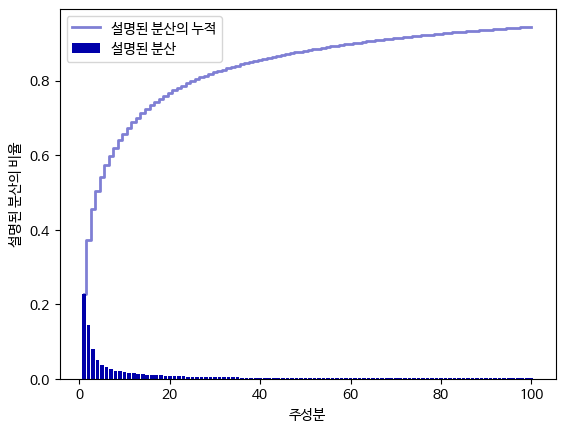

In [ ]:
plt.bar(range(1,101), pca.explained_variance_ratio_,
        align='center', label='설명된 분산')
plt.step(range(1,101), np.cumsum(pca.explained_variance_ratio_), alpha=0.5,
         where='mid', label='설명된 분산의 누적') # 적절한 주성분 갯수를 찾으려면
plt.ylabel('설명된 분산의 비율')
plt.xlabel('주성분')
plt.legend()
plt.show()

In [ ]:
# 주성분 40개 > 분산 설명 80%
pca = PCA(n_components=40, whiten=True, random_state=0).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

knn.fit(X_train_pca, y_train)
print("테스트 세트 정확도: {:.2f}".format(knn.score(X_test_pca, y_test)))

테스트 세트 정확도: 0.94


In [47]:
# 80% 분산 비율에 해당하는 주성분 갯수는?
pca = PCA(n_components=0.8, whiten=True, random_state=0).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

knn.fit(X_train_pca, y_train)
print("테스트 세트 정확도: {:.2f}".format(knn.score(X_test_pca, y_test)))
print("주성분 개수: ", pca.n_components_)

테스트 세트 정확도: 0.94
주성분 개수:  26


### 3.4.2 NMF (음수 미포함 행렬 분해) Non-negative Matrix Factorization
- PCA: 데이터 분산이 가장 큰 성분, 수직인 성분

- NMF: 음수가 아닌 성분과 계수를 찾는다(factorization)

  > 음수가 아닌 성분과 가중치로 데이터를 분해하는 기능: 예) 섞여있는 악기소리+목소리


Non-negative Matrix Factorization(NMF),공돌이의 수학정리노트 (Angelo's Math Notes), https://angeloyeo.github.io/2020/10/15/NMF.html

음료 A, B, C가 있는데, 각각은 여러 과일(사과, 오렌지, 포도 등)이 섞여서 만들어졌다고 해보죠.

        사과   오렌지   포도

음료 A	3	2	0

음료 B	1	4	1

음료 C	0	1	5


- 행렬 X은 “각 음료가 과일을 얼마나 포함하는가”를 보여주는 혼합 정보입니다.


🧩 NMF는 이걸 다시 "재료"와 "조합 비율"로 나누는 것

 - NMF는 이 데이터를 다음 두 가지로 나눠줍니다:


   > 기본 재료(과일 조합의 패턴) 행렬 → W


   > 음료가 각 재료를 얼마나 사용했는지(혼합 비율) 행렬 → H

음료 X 과일 = (음료 X 재료) × (재료 X 과일)

      X     ≈        W        ×       H


얼굴 이미지를 예로 들어보면:


X: 여러 사람 얼굴 사진 (픽셀 정보)


W: 얼굴의 기본 조각들 (눈, 코, 입 같은 특징)


H: 각 얼굴이 그 조각들을 얼마나 섞어서 만들어졌는지


즉, NMF는 복잡한 이미지를 단순한 조각의 조합으로 표현

NMF의 핵심 원리

- NMF는 데이터 행렬 X를 두 개의 비음수 행렬 W와 H로 분해.

𝑋 ≈ 𝑊 × 𝐻

𝑊 → 각 샘플이 **기저 패턴(components)**을 얼마나 포함하는지 나타내는 가중치 행렬

𝐻 → 각 패턴이 원래 특성에서 어떻게 구성되는지 나타내는 패턴 행렬



#### 인위적 데이터에 NMF 적용하기

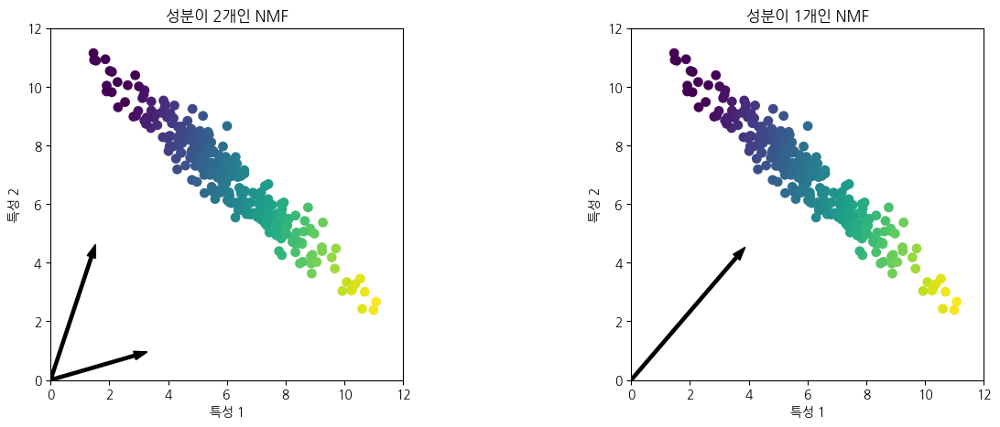

In [ ]:
mglearn.plots.plot_nmf_illustration() # 2차원 데이터에 NMF 적용

#### 얼굴 이미지에 NMF 적용하기
- NMF의 핵심 매개변수는 추출할 성분의 갯수 > X = W.H에서 W의 열의 갯수 > 추출할 기본 feature의 갯수


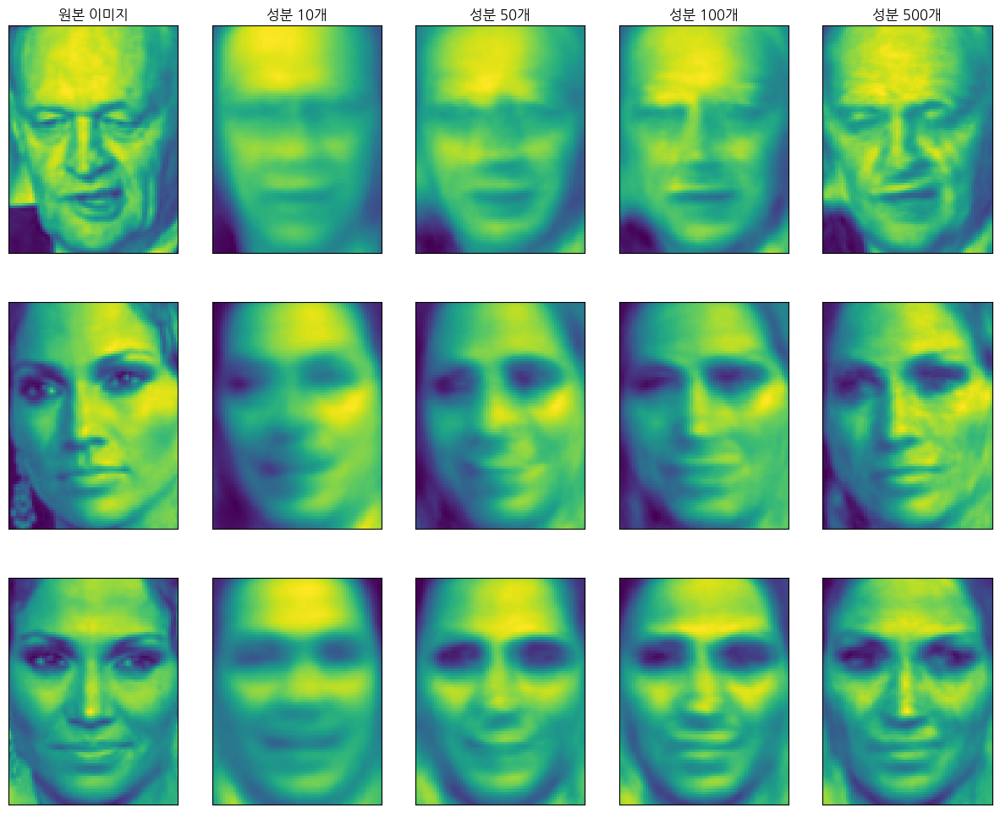

In [ ]:
# 2분 26초 걸림
mglearn.plots.plot_nmf_faces(X_train, X_test[:3], image_shape)

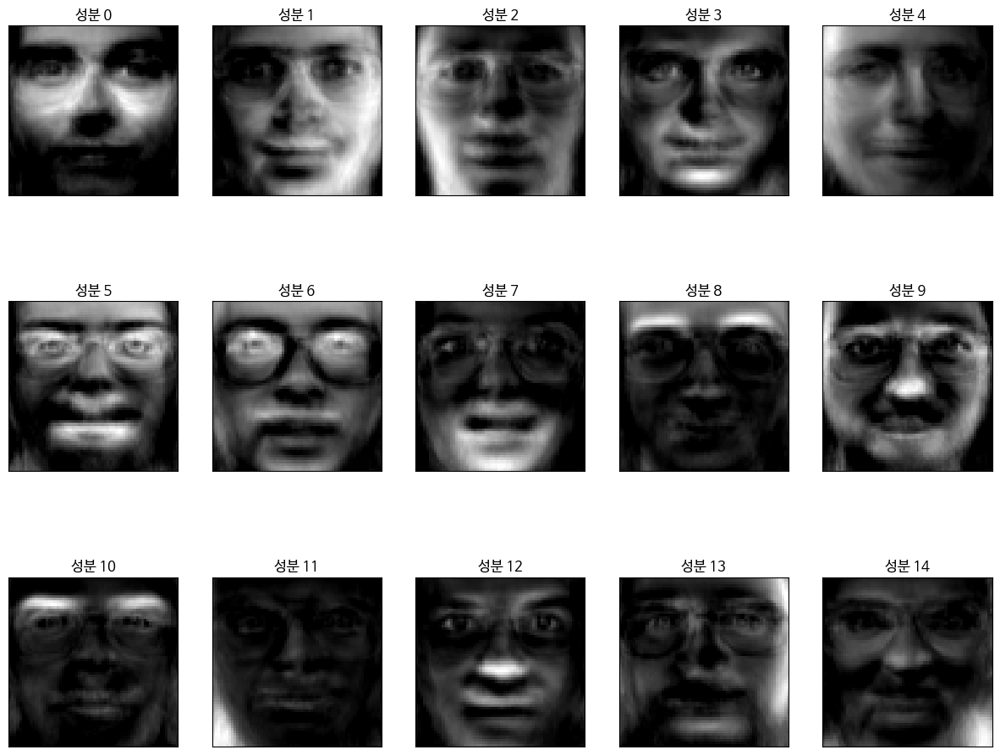

In [22]:
#성분을 15개 추출
from sklearn.decomposition import NMF
nmf = NMF(n_components=15, init='nndsvd', random_state=0, max_iter=1000, tol=1e-2)
nmf.fit(X_train)
X_train_nmf = nmf.transform(X_train)
X_test_nmf = nmf.transform(X_test)

fig, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (component, ax) in enumerate(zip(nmf.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape))
    ax.set_title("성분 {}".format(i))

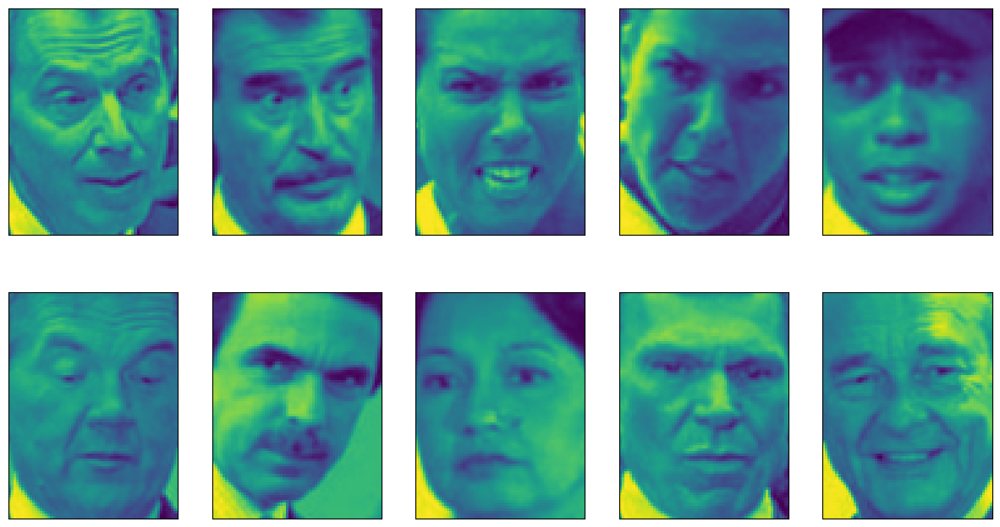

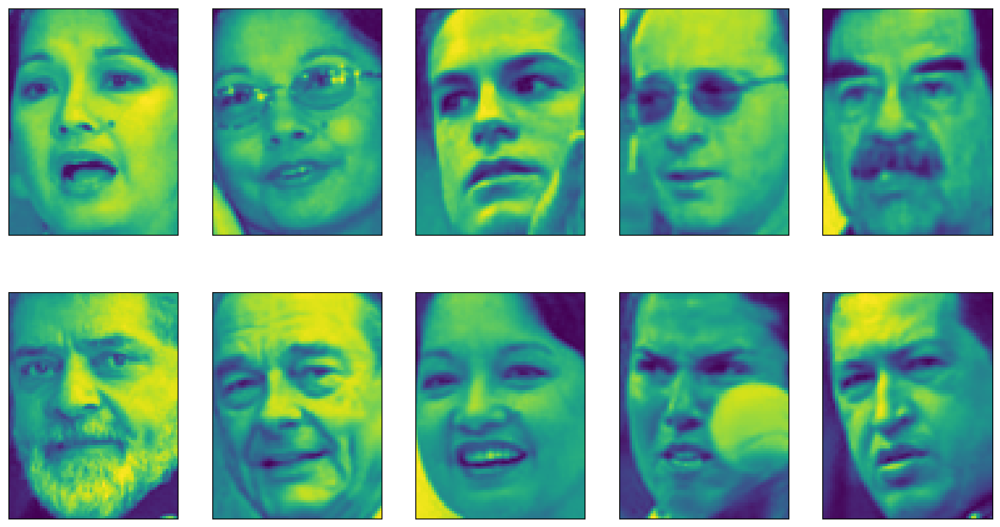

In [ ]:
compn = 3 # 4번째 성분으로 오른쪽으로 돌아간 얼굴
# 4번째 성분으로 정렬하여 처음 10개 이미지를 출력합니다
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))

compn = 7 # 왼쪽으로 돌아가 있는 얼굴들
# 8번째 성분으로 정렬하여 처음 10개 이미지를 출력합니다
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))

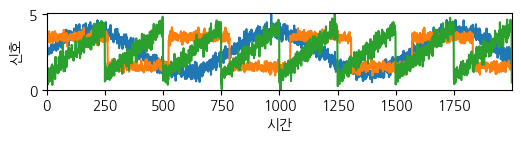

In [ ]:
# 3개의 서로 다른 입력으로 합성된 신호
S = mglearn.datasets.make_signals() # (2000,3) 2000개의 샘플 x 3개의 원 신호
plt.figure(figsize=(6, 1))
plt.plot(S, '-')
plt.xlabel("시간")
plt.ylabel("신호")
plt.margins(0)

In [ ]:
# 원본 데이터를 사용해 100개의 측정 데이터를 만듭니다
A = np.random.RandomState(0).uniform(size=(100, 3)) # (100,3)
X = np.dot(S, A.T) # (3,100) > X.shape = (2000,100) > 각 열은 1개의 혼합 신호 > 100개의 혼합신호
# 원래의 3개 신호(S)를 서로 다른 100개의 가중치 조합(A)으로 섞어서 만든 것
print("측정 데이터 형태:", X.shape)

측정 데이터 형태: (2000, 100)


In [ ]:
# X는 원래의 3개 신호에서 100개의 서로 다른 특성(혼합 신호)을 만들어 낸 것
nmf = NMF(n_components=3, init='nndsvd', random_state=42, max_iter=1000, tol=1e-2)
S_ = nmf.fit_transform(X)
print("복원한 신호 데이터 형태:", S_.shape)

복원한 신호 데이터 형태: (2000, 3)


In [40]:
pca = PCA(n_components=3)
H = pca.fit_transform(X)

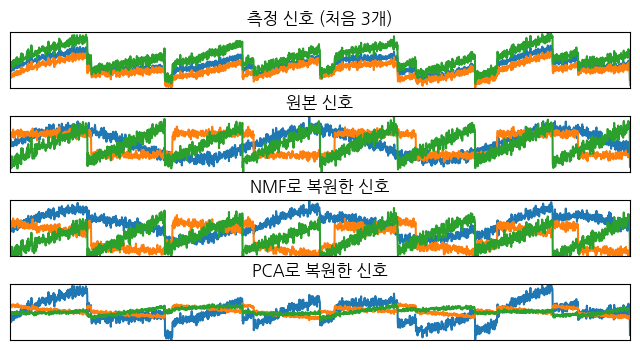

In [ ]:
models = [X, S, S_, H]
names = ['측정 신호 (처음 3개)',
         '원본 신호',
         'NMF로 복원한 신호', # 잘 복원
         'PCA로 복원한 신호'] # 실패

fig, axes = plt.subplots(4, figsize=(8, 4), gridspec_kw={'hspace': .5},
                         subplot_kw={'xticks': (), 'yticks': ()})

for model, name, ax in zip(models, names, axes):
    ax.set_title(name)
    ax.plot(model[:, :3], '-')
    ax.margins(0)

### 3.4.3 t-SNE(stochastic neighbor embedding)를 이용한 매니폴드 학습

manifold 뜻?
- many + fold ->  많이 접힌 -> 다양한 형태
  > 고차원 공간에서 많이 접히고 구부러진 저차원 표면
- 수학적 의미: 고차원 공간 속의 저차원 곡면
- 차원 축소: 고차원 데이터의 내부 구조(manifold)를 펼쳐서 저차원으로 표현
  > 매니폴드 학습 알고리즘의 목적: 시각화를 위한 저차원 데이터 표현

- 매니폴드(manifold)는 고차원 공간 속에서 데이터가 실제로는 더 낮은 차원 구조(곡면) 위에 존재한다는 가정

- 데이터의 **곡면 구조(매니폴드)**를 보존하면서 차원을 축소

  > 데이터 포인트 사이의 거리를 잘 보존하는 2차원 표현을 찾는다
   
  > 3D(고차원)에서 가까운 점을 2D에서 가깝게 만든다 > 고차원 -> 저차원으로 매핑


- Isomap, LLE (Locally Linear Embedding), t-SNE, UMAP

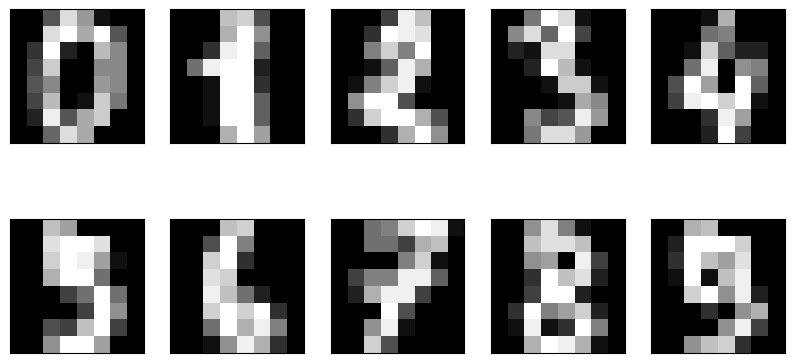

In [23]:
# 손글씨 숫자 데이터세트
from sklearn.datasets import load_digits
digits = load_digits()

fig, axes = plt.subplots(2, 5, figsize=(10, 5),
                         subplot_kw={'xticks':(), 'yticks': ()})
for ax, img in zip(axes.ravel(), digits.images):
    ax.imshow(img)

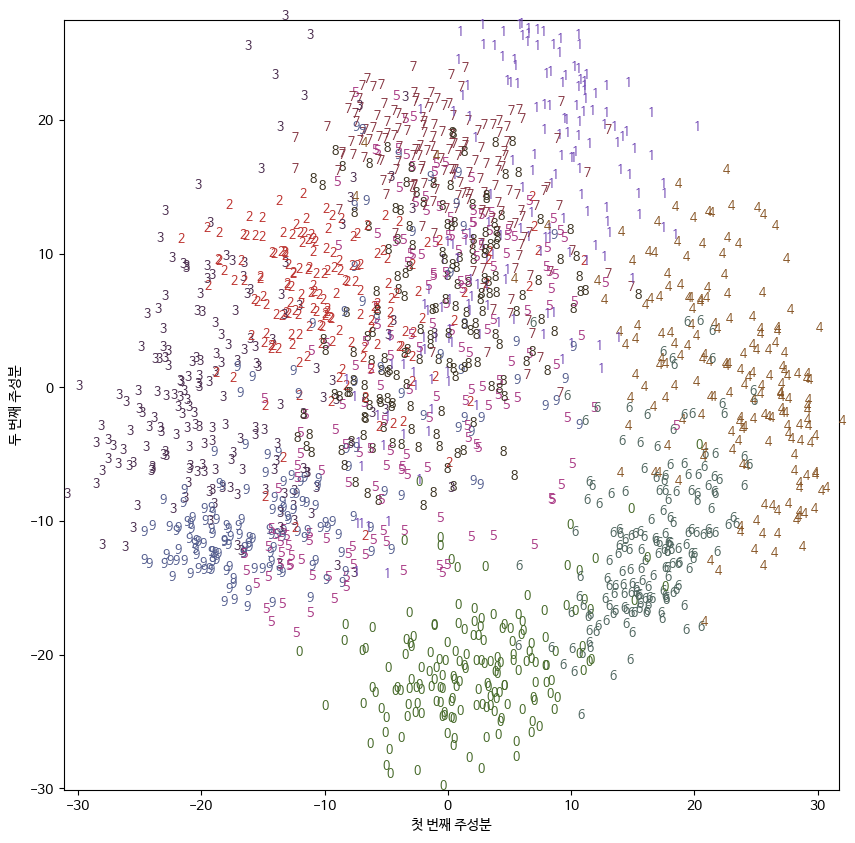

In [ ]:
# PCA 모델을 생성합니다
pca = PCA(n_components=2) # 2차원으로 축소해 시각화
pca.fit(digits.data)
# 처음 두 개의 주성분으로 숫자 데이터를 변환합니다
digits_pca = pca.transform(digits.data)
colors = ["#476A2A", "#7851B8", "#BD3430", "#4A2D4E", "#875525",
          "#A83683", "#4E655E", "#853541", "#3A3120","#535D8E"]
plt.figure(figsize=(10, 10))
plt.xlim(digits_pca[:, 0].min(), digits_pca[:, 0].max())
plt.ylim(digits_pca[:, 1].min(), digits_pca[:, 1].max())
for i in range(len(digits.data)):
    # 숫자 텍스트를 이용해 산점도를 그립니다
    plt.text(digits_pca[i, 0], digits_pca[i, 1], str(digits.target[i]),
             color = colors[digits.target[i]],
             fontdict={'weight': 'bold', 'size': 9})
plt.xlabel("첫 번째 주성분")
plt.ylabel("두 번째 주성분")
plt.show() # 책에는 없음 > 0,6,4는 비교적 잘 분리 > 나머지는 엉켜있다

In [24]:
# t-SNE 적용 > 모든 클래스가 확실히 구분됨

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from sklearn.manifold import TSNE
tsne = TSNE(random_state=42)
# TSNE에는 transform 메소드가 없으므로 대신 fit_transform을 사용합니다
digits_tsne = tsne.fit_transform(digits.data)

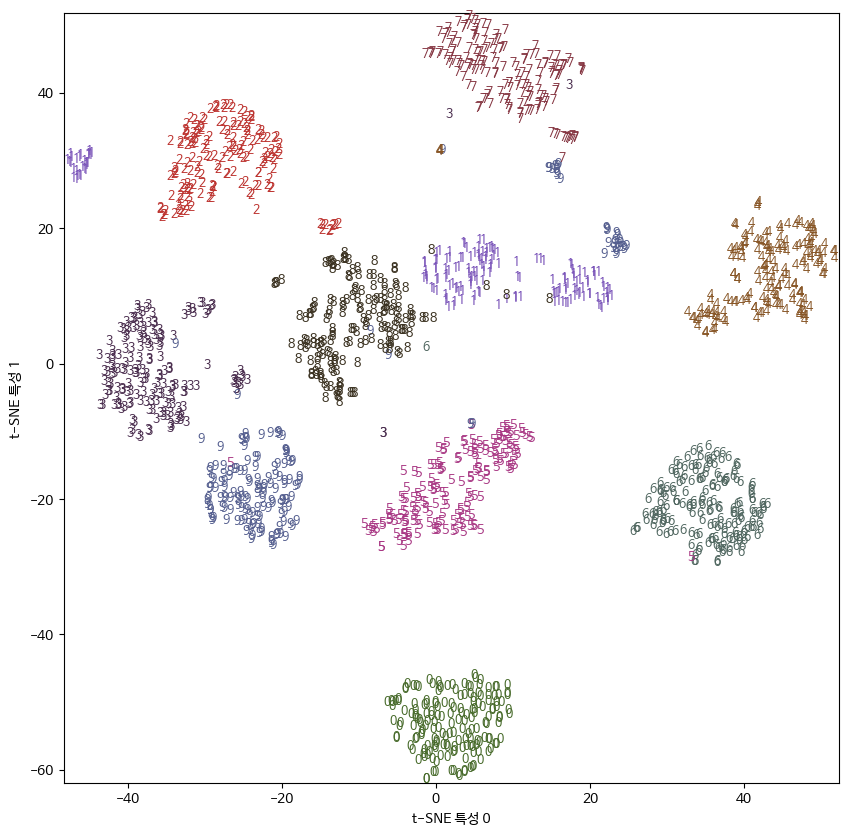

In [28]:
plt.figure(figsize=(10, 10))
plt.xlim(digits_tsne[:, 0].min(), digits_tsne[:, 0].max() + 1)
plt.ylim(digits_tsne[:, 1].min(), digits_tsne[:, 1].max() + 1)
for i in range(len(digits.data)):
    # 숫자 텍스트를 이용해 산점도를 그립니다
    plt.text(digits_tsne[i, 0], digits_tsne[i, 1], str(digits.target[i]),
             color = colors[digits.target[i]],
             fontdict={'weight': 'bold', 'size': 9})
plt.xlabel("t-SNE 특성 0")
plt.ylabel("t-SNE 특성 1")
plt.show() # 책에는 없음

T-SNE (t-distributed stochastic neighbor embedding), 데이터_박과장 2023. 3. 28. 14:03,https://d-craftshop.tistory.com/21

t-SNE 개념과 사용법,JINSOL KIM,2019, Feb 09    ,https://gaussian37.github.io/ml-concept-t_sne/

쿨백-라이블러 발산(Kullback-Leibler Divergence, KL Divergence):
- 당신은 내일 비가 올 확률이 70%, 안 올 확률이 30%라고 예측했어요. (예측 분포 = Q)
- 실제로는, 기상청의 정확한 자료(P)에 따르면 비가 올 확률은 90%, 안 올 확률은 10%입니다. (진짜 분포 = P)
- KL 발산: 예측(Q)이 진짜(P)와 얼마나 다른 거니?"
  KL(P||Q) = sigma(P(x). log(P(x)/Q(x))
   > P(x): 실제 데이터의 분포
   > Q(x): 우리가 만든 모델의 예측 분포
   > 로그 비율: 얼마나 다른지를 재는 "차이"

- t-SNE는 고차원 공간의 데이터 분포와 저차원으로 투영한 데이터 분포 사이의 KL 발산을 최소화

Information Theory 이해하기 - 정보량과 Entropy,미미수 2021. 7. 12. 18:41
출처: https://memesoo99.tistory.com/38 [미미로그:티스토리]

- 정보량 I(x) = -log P(x) > 확률 P(x)가 작아질수록 정보량은 커짐

- 엔트로피 H(X) = E[I(X)] = sigma P(x) .I(x)

Entropy와 Cross entropy, 그리고 KL-divergence, 정보 이론 [2],bono. 2021. 7. 27. 00:34,https://ivdevlog.tistory.com/13

- 엔트로피 H(P) = H(x) = E X~P[I(x)] = E X~P[-logP(x)]
  > X~P의 의미는 확률변수 X가 분포 P에서 샘플링되었다

  > E X~P[]는 그 분포를 기반으로 기대값을 계산

**교차 엔트로피 (Cross Entropy)**는 머신러닝에서 자주 쓰이는 개념 >
  > "실제값(P)"과 "모델이 예측한 확률(Q)" 사이의 차이를 측정하는 지표

  > 교차의 의미는 "비교"한다는 뜻

- 교차 엔트로피는 실제 정답(P)을 기준으로, 예측 확률(Q)이 얼마나 틀렸는지를 측정

- 교차 엔트로피 H(P,Q) = - sigma(P(x) .log Q(x)) # P(x): 실제 정답 분포, Q(x): 모델이 예측한 분포

  > 예측 Q와 실제 P가 같으면 H(P,Q) 값은 최소

  > 예측이 정답과 다르면 P, Q의 분포 차이가 커지고 H(P,Q) 값이 커짐

  > 교차 엔트로피는 정답 분포 P와 모델 예측 분포 Q가 얼마나 비슷한지를, 정답 클래스 확률을 기반으로 측정하는 손실”

- 왜 P(x)logQ(x) 인가?

  > 기대값 개념 > 확률 * 정보량 = P(x) * (-log Q(x))

  > 예측 모델(Q)이 그 사건을 맞힐 확률이 높을수록 logQ(x) 값이 커지고(손실 작음), 틀릴수록 값이 작아져서 손실이 커집니다.

- KLD 정의: 두 확률분포 P (실제 분포)와 Q (예측 분포) 사이의 KLD 정의

  > D KL(P||Q) = sigma P(x) log(P(x)/Q(x))

## 3.5 군집

- 데이터세트를 cluster 그룹으로 나누는 작업

### 3.5.1 k-평균 (k-means) 군집

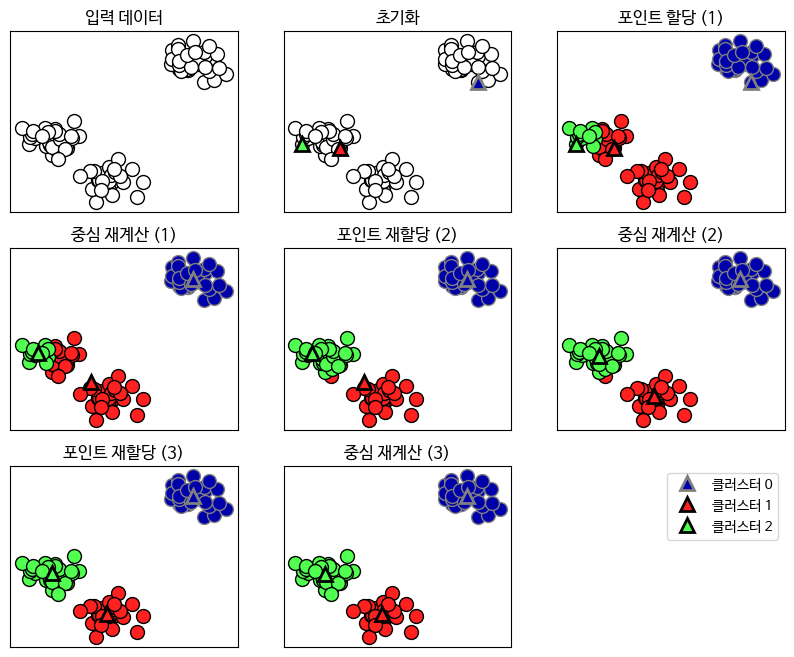

In [30]:
mglearn.plots.plot_kmeans_algorithm() # 238페이지 첫째 문단 이해

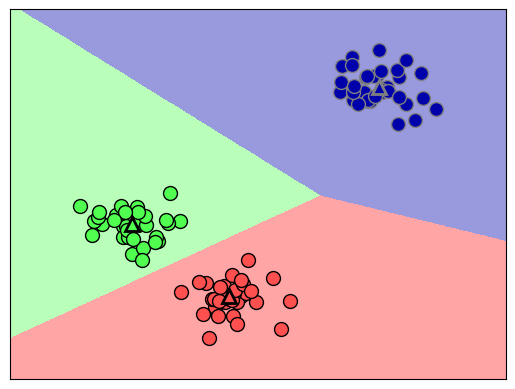

In [31]:
mglearn.plots.plot_kmeans_boundaries()

In [31]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# 인위적으로 2차원 데이터를 생성합니다
X, y = make_blobs(random_state=1)

# 군집 모델을 만듭니다
kmeans = KMeans(n_clusters=3) #클러스터 수를 지정해야 한다 
kmeans.fit(X) # 다시 학습하면 labels_의 값이 달라진다 > 레이블 번호 자체는 별의미없다 > 241페이지 첫째 문단

KMeans(n_clusters=3)

In [32]:
print(kmeans.labels_) #훈련데이터 포인틍 클러스터 레이블이 할당됨: labels_ 속성으로 확인

[0 1 1 1 2 2 2 1 0 0 1 1 2 0 2 2 2 0 1 1 2 1 2 0 1 2 2 0 0 2 0 0 2 0 1 2 1
 1 1 2 2 1 0 1 1 2 0 0 0 0 1 2 2 2 0 2 1 1 0 0 1 2 2 1 1 2 0 2 0 1 1 1 2 0
 0 1 2 2 0 1 0 1 1 2 0 0 0 0 1 0 2 0 0 1 1 2 2 0 2 0]


In [33]:
print(kmeans.predict(X)) # 훈련 데이터 포인트에 대한 예측 결과 > 각 포인트에 가장 가까운 클러스터의 레이블을 출력

[0 1 1 1 2 2 2 1 0 0 1 1 2 0 2 2 2 0 1 1 2 1 2 0 1 2 2 0 0 2 0 0 2 0 1 2 1
 1 1 2 2 1 0 1 1 2 0 0 0 0 1 2 2 2 0 2 1 1 0 0 1 2 2 1 1 2 0 2 0 1 1 1 2 0
 0 1 2 2 0 1 0 1 1 2 0 0 0 0 1 0 2 0 0 1 1 2 2 0 2 0]


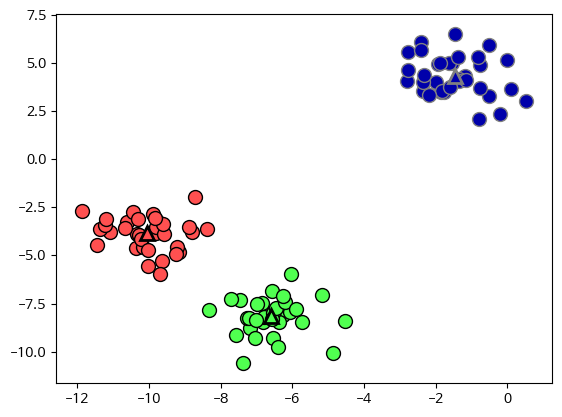

In [34]:
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers='o')
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], [0, 1, 2],
    markers='^', markeredgewidth=2)
plt.show() # 책에는 없음

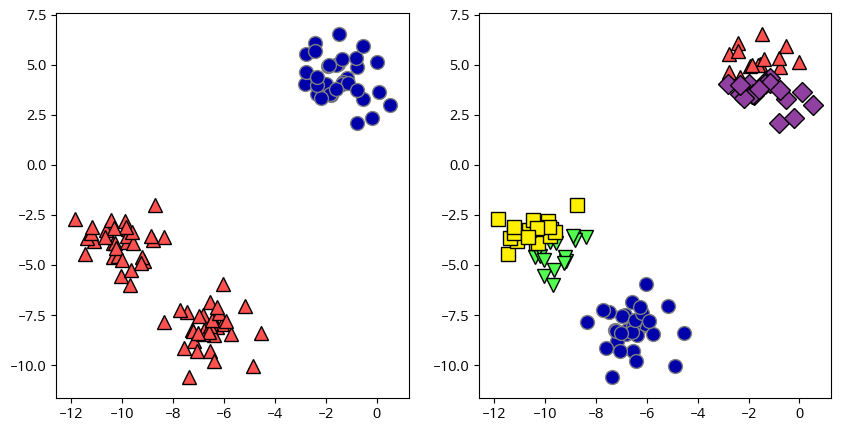

In [35]:
# 클러스터 수를 2, 5로 지정 > 군집이 잘 맞지 않는다

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# 두 개의 클러스터 중심을 사용합니다
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
assignments = kmeans.labels_

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[0])

# 다섯 개의 클러스터 중심을 사용합니다
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
assignments = kmeans.labels_

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[1])
plt.show() # 책에는 없음

#### k-평균 알고리즘이 실패하는 경우

- 클러스터 밀도가 다를 때: 그림 3-27

  > k-평균은 클러스터 반경이 모두 같다고 가정해서 생긴 현상 

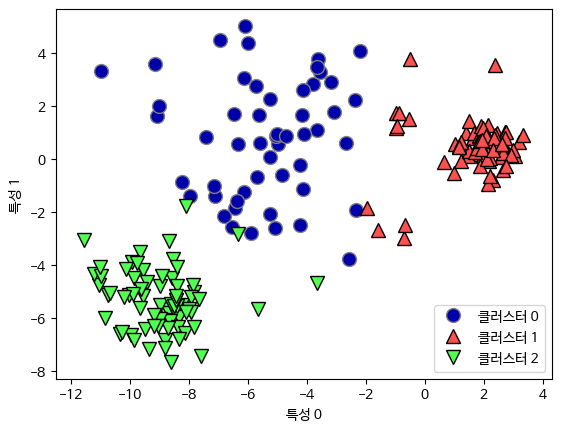

In [36]:
X_varied, y_varied = make_blobs(n_samples=200,
                                cluster_std=[1.0, 2.5, 0.5],
                                random_state=170)
y_pred = KMeans(n_clusters=3, random_state=0).fit_predict(X_varied)

mglearn.discrete_scatter(X_varied[:, 0], X_varied[:, 1], y_pred)
plt.legend(["클러스터 0", "클러스터 1", "클러스터 2"], loc='best')
plt.xlabel("특성 0")
plt.ylabel("특성 1")
plt.show() # 책에는 없음

- k-평균은 클러스터 방향이 모두 똑같이 중요하다고 가정
  
  > k-평균은 가장 가까운 클러스터 중심까지의 거리만 고려

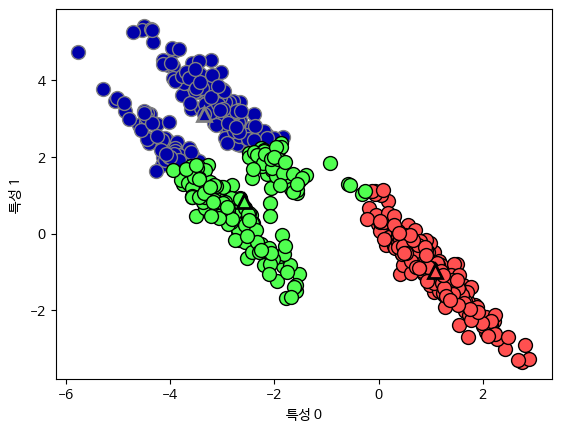

In [37]:
# 무작위로 클러스터 데이터 생성합니다
X, y = make_blobs(random_state=170, n_samples=600)
rng = np.random.RandomState(74)

# 데이터가 길게 늘어지도록 변경합니다
transformation = rng.normal(size=(2, 2))
X = np.dot(X, transformation)

# 세 개의 클러스터로 데이터에 KMeans 알고리즘을 적용합니다
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# 클러스터 할당과 클러스터 중심을 나타냅니다
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers='o')
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], [0, 1, 2],
    markers='^', markeredgewidth=2)
plt.xlabel("특성 0")
plt.ylabel("특성 1")
plt.show() # 책에는 없음

Text(0, 0.5, '특성 1')

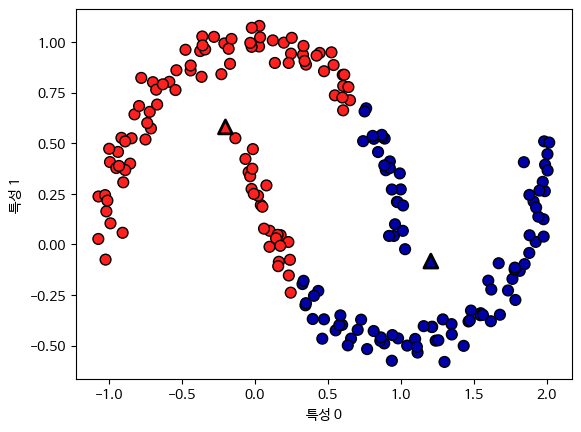

In [38]:
# two_moons 데이터를 생성합니다(이번에는 노이즈를 조금만 넣습니다)
## 두개의 반달 모양 > 실패

from sklearn.datasets import make_moons
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# 두 개의 클러스터로 데이터에 KMeans 알고리즘을 적용합니다
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# 클러스터 할당과 클러스터 중심을 표시합니다
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm2, s=60, edgecolors='k')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            marker='^', c=[mglearn.cm2(0), mglearn.cm2(1)], s=100, linewidth=2, edgecolors='k')
plt.xlabel("특성 0")
plt.ylabel("특성 1")

#### 벡터 양자화 또는 분해 메소드로서의 k-평균

- PCA: 데이터에서 분산이 가장 큰 주성분 찾는다

- NMF: 데이터를 양수 성분의 가중합(중첩 가능한 성분)으로 표현

- k-평균: 각 데이터 포인트를 가장 가까운 하나의 대표 벡터(성분)로 표현 > 벡터 양자화

In [ ]:
# PCA, NMF, k-평균에서 추출한 성분 : 그림 3-30, 재구성:그림 3-31
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=42)
nmf = NMF(n_components=100, init='nndsvd', max_iter=1000, tol=1e-2, random_state=0)
nmf.fit(X_train)
pca = PCA(n_components=100, random_state=0)
pca.fit(X_train)
kmeans = KMeans(n_clusters=100, random_state=0)
kmeans.fit(X_train)

X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test))
X_reconstructed_kmeans = kmeans.cluster_centers_[kmeans.predict(X_test)] # k-평균 재구성은 훈련세트에서 가장 가까운 클러스터 중심 
X_reconstructed_nmf = np.dot(nmf.transform(X_test), nmf.components_)

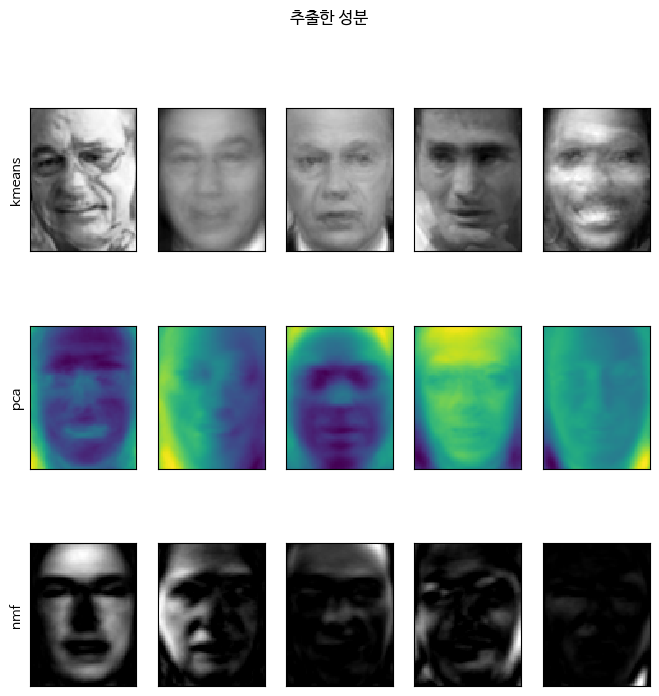

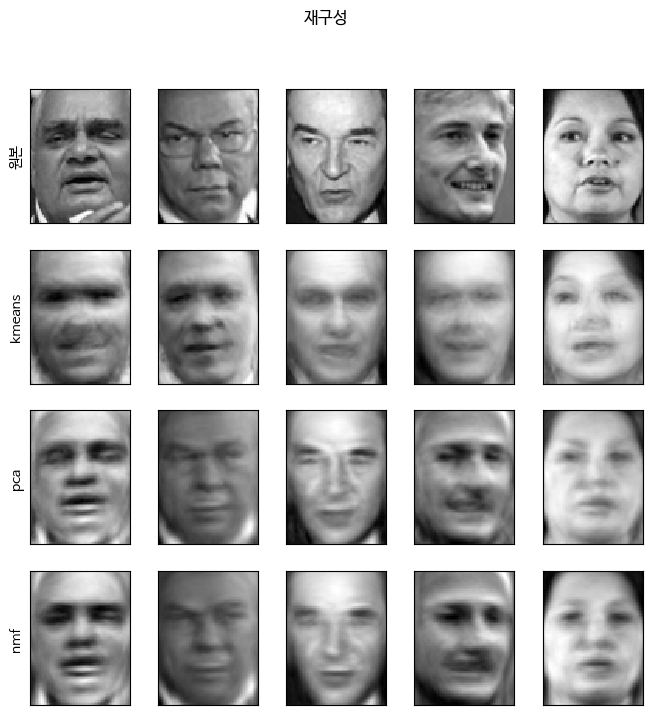

In [40]:
fig, axes = plt.subplots(3, 5, figsize=(8, 8), subplot_kw={'xticks': (), 'yticks': ()})
fig.suptitle("추출한 성분")
for ax, comp_kmeans, comp_pca, comp_nmf in zip(
        axes.T, kmeans.cluster_centers_, pca.components_, nmf.components_):
    ax[0].imshow(comp_kmeans.reshape(image_shape))
    ax[1].imshow(comp_pca.reshape(image_shape), cmap='viridis')
    ax[2].imshow(comp_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("kmeans")
axes[1, 0].set_ylabel("pca")
axes[2, 0].set_ylabel("nmf")

fig, axes = plt.subplots(4, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(8, 8))
fig.suptitle("재구성")
for ax, orig, rec_kmeans, rec_pca, rec_nmf in zip(
        axes.T, X_test, X_reconstructed_kmeans, X_reconstructed_pca,
        X_reconstructed_nmf):

    ax[0].imshow(orig.reshape(image_shape))
    ax[1].imshow(rec_kmeans.reshape(image_shape))
    ax[2].imshow(rec_pca.reshape(image_shape))
    ax[3].imshow(rec_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("원본")
axes[1, 0].set_ylabel("kmeans")
axes[2, 0].set_ylabel("pca")
axes[3, 0].set_ylabel("nmf")
plt.show() # 책에는 없음

- k-평균을 사용한 벡터 양자화

  > 3차원 공간에 점들이 흩어져 있는 데이터세트: 입력 데이터의 차원: 3차원

  > 클러스터 수: 그 공간을 나누는 구역의 개수: 5개 10개 일 수 있다 

클러스터 레이블:
 [8 4 6 3 1 1 5 2 8 4 9 2 1 4 7 5 0 2 0 7 1 2 0 4 9 6 1 1 6 0 8 9 2 6 8 1 2
 5 3 6 2 7 8 6 4 9 5 7 6 2 7 2 1 3 4 8 0 4 0 9 2 3 1 8 4 3 9 4 9 3 2 3 2 6
 2 3 6 8 0 2 1 9 2 1 6 9 5 9 2 1 0 5 1 7 1 1 4 2 3 6 4 1 9 5 3 6 3 7 4 0 7
 9 9 3 8 4 8 1 2 8 8 7 6 9 6 7 5 6 4 1 5 7 3 6 4 4 4 3 1 8 6 6 0 9 7 5 6 4
 0 6 2 4 8 0 2 9 4 2 0 0 6 4 0 4 2 1 0 2 4 2 0 3 3 7 6 2 1 7 7 0 4 3 1 4 1
 0 9 2 3 7 3 0 8 5 6 7 1 6 9 4]


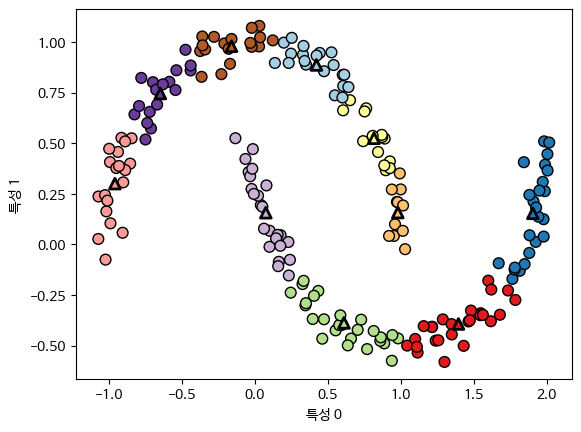

In [41]:
# two_moons 데이터: 2차원 데이터이므로 PCA, NMF로는 성분 분리(1차원)로 원본 데이터 구조를 잃어버린다

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
y_pred = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=60, cmap='Paired', edgecolors='black')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=60,
            marker='^', c=range(kmeans.n_clusters), linewidth=2, cmap='Paired', edgecolors='black')
plt.xlabel("특성 0")
plt.ylabel("특성 1")
print("클러스터 레이블:\n", y_pred)

In [ ]:
distance_features = kmeans.transform(X)
print("클러스터 거리 데이터의 형태:", distance_features.shape)
print("클러스터 거리:\n", distance_features)

클러스터 거리 데이터의 형태: (200, 10)
클러스터 거리:
 [[0.922 1.466 1.14  ... 1.166 1.039 0.233]
 [1.142 2.517 0.12  ... 0.707 2.204 0.983]
 [0.788 0.774 1.749 ... 1.971 0.716 0.944]
 ...
 [0.446 1.106 1.49  ... 1.791 1.032 0.812]
 [1.39  0.798 1.981 ... 1.978 0.239 1.058]
 [1.149 2.454 0.045 ... 0.572 2.113 0.882]]


- k-평균 장점:

  > 비교적 이해하기 쉽고 구현도 간단, 비교적 처리가 빠르다

  > 대용량 데이터세트에도 잘 작동, 매우 큰 데이터세트 처리: MiniBatchKMeans

- k-평균 단점:
  > 무작위 초기화: 3개 클러스터 시작점을 난수로 선택 > 난수 초기값에 따라 결과가 달라질 수 있다

  > 가장 큰 단점: 클러스터 갯수를 지정해야 한다

#### 엘보우(elbow) 방법
- k- 평균에서 클러스터 개수를 선택하는 방법:

  > inertia: 클러스터 중심 - 클러스터에 속한 샘플 간의 제곱거리의 합

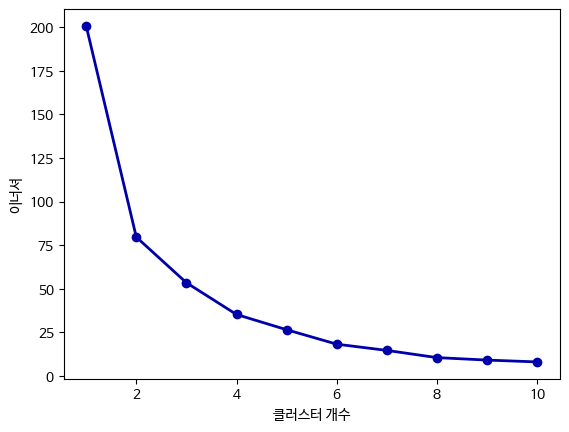

In [42]:
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('클러스터 개수')
plt.ylabel('이너셔')
plt.show()

### 3.5.2 병합(agglomerative) 군집
- agglomerate(뭉치다): to gather into a cluster

- 작은 군집(클러스터)부터 시작해 점점 큰 군집으로 합쳐 나가는 방식

  > 처음에는 각 데이터 포인트가 자기 자신만 포함하는 군집으로 시작

  > 가장 비슷한(거리가 가까운) 두 군집을 찾아 하나로 뭉친다(merge)

  > 이 과정을 모든 데이터가 하나의 군집이 될 때까지 반복

  > 결과는 나무 구조(dendrogram)로 표현되어, 원하는 단계에서 잘라 k개의 군집을 만든다

- 가장 비슷한 두 군집을 찾는 방법(scikit-learn에 구현된 옵션)

  1) WARD (Joe J. Ward가 제안) - sum of squared erros(클러스터 중심점 - 각 점 거리)

  2) average: 뭉칠 대상인 두 클러스터 포인트 사이의 평균 거리가 가장 짧은 두 클러스터를 뭉친다

  3) complete : 칠 대상인 두 클러스터 포인트 사이의 최대 거리가 가장 짧은 두 클러스터를 뭉친다 

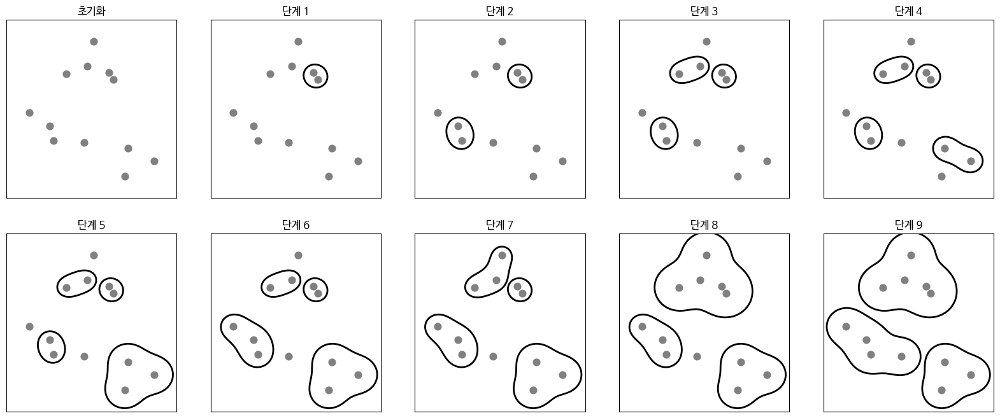

In [ ]:
mglearn.plots.plot_agglomerative_algorithm() # 단계 5에서 3점으로 구성된 클러스터 등장

- 병합(agglomerative) 군집에 predict() 메서드가 없는 이유: 병합 군집은 완성된 모델이 아니라 절차 과정일 뿐이다 

  > 새로운 데이터에 대한 “일반화된” 결정 경계가 정의되지 않기 때문이다

  > 새 데이터가 들어오면, 원래 만든 덴드로그램에 “자연스럽게” 넣을 방법이 명확하지 않음.

    >> 기존 포인트 간의 거리 기반으로 전체 병합 과정을 다시 해야 함

- k-평균 같은 알고리즘

  > 중심점(centroid)을 수치로 저장

  > 새 데이터가 들어오면 가장 가까운 중심을 찾는 방식으로 즉시 분류 가능 → predict() 가능.

Text(0, 0.5, '특성 1')

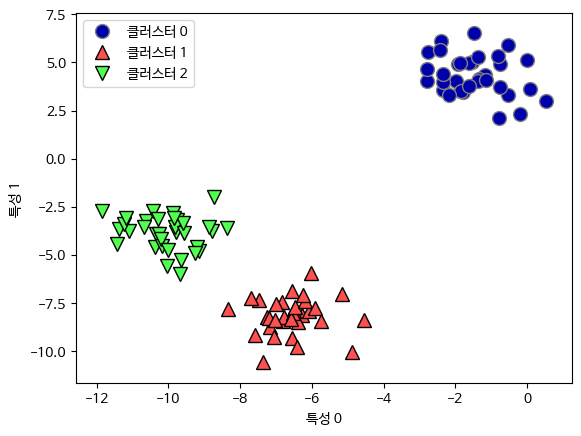

In [44]:
# 새로운 데이터가 포함된 훈련데이터로 fit_predict()를 사용

from sklearn.cluster import AgglomerativeClustering
X, y = make_blobs(random_state=1)

agg = AgglomerativeClustering(n_clusters=3)
assignment = agg.fit_predict(X)

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignment)
plt.legend(["클러스터 0", "클러스터 1", "클러스터 2"], loc="best")
plt.xlabel("특성 0")
plt.ylabel("특성 1")

#### 계층적 군집과 덴드로그램(dendrograms)

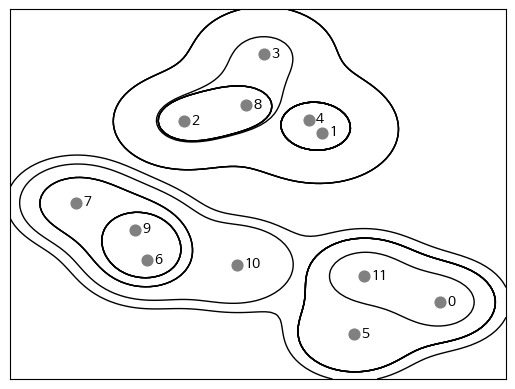

In [ ]:
mglearn.plots.plot_agglomerative() # 그림 3-33의 클러스터들을 겹쳐서 표현

- 계층적 군집의 그래표 표현 : 2차원 데이터세트에 사용 > 3차원 이상 데이터세트는 시각화가 어렵다

- 덴드로그램: 계층 군집을 시각화 > 덴드로그램은 누가 누구랑 먼저 합쳐졌는지와 그때의 거리만 표시

  > 혈통도는 누가 누구랑 가까운지만 보여줌 > 차원이 높든 낮든 관계 없음 (255페이지 그림 3-35 밑 문단)

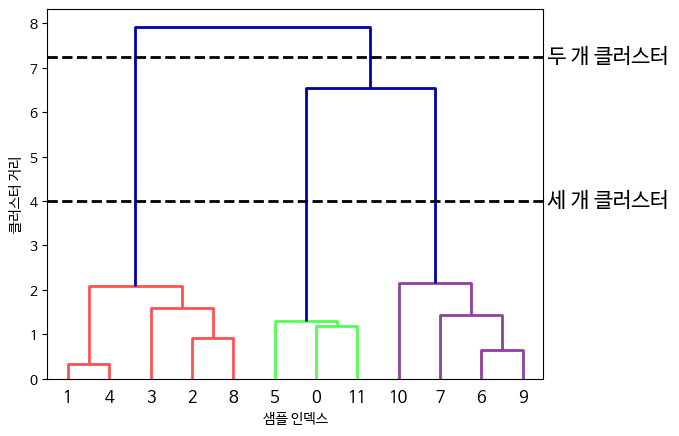

In [46]:
# SciPy에서 ward 군집 함수와 덴드로그램 함수를 임포트합니다
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_blobs(random_state=0, n_samples=12)
# 데이터 배열 X 에 ward 함수를 적용합니다
# SciPy의 ward 함수는 병합 군집을 수행할 때 생성된
# 거리 정보가 담긴 배열을 리턴합니다
linkage_array = ward(X)
# 클러스터 간의 거리 정보가 담긴 linkage_array를 사용해 덴드로그램을 그립니다
dendrogram(linkage_array)

# 두 개와 세 개의 클러스터를 구분하는 커트라인을 표시합니다
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' 두 개 클러스터', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' 세 개 클러스터', va='center', fontdict={'size': 15})
plt.xlabel("샘플 인덱스")
plt.ylabel("클러스터 거리")
plt.show()

In [ ]:
agg = AgglomerativeClustering(n_clusters=None, distance_threshold=0)
# 각 노드의 자식 노드 정보: children_ 속성
# 노드 사이의 거리를 담은 distances_ 속성
agg.fit(X)

AgglomerativeClustering(distance_threshold=0, n_clusters=None)

In [ ]:
print(agg.children_)

[[ 1  4]
 [ 6  9]
 [ 2  8]
 [ 0 11]
 [ 5 15]
 [ 7 13]
 [ 3 14]
 [12 18]
 [10 17]
 [16 20]
 [19 21]]


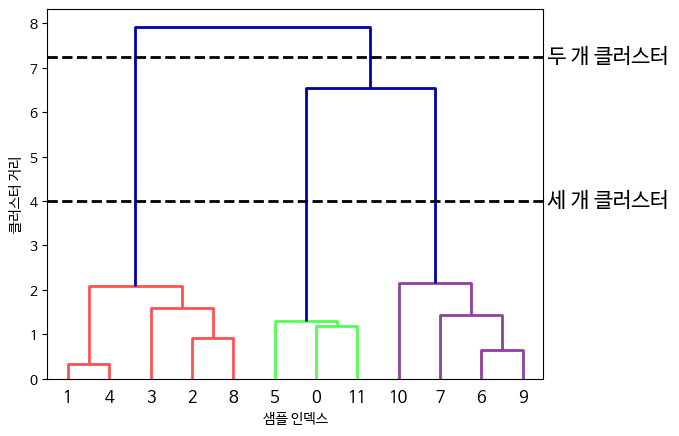

In [48]:
counts = np.zeros(agg.children_.shape[0])
n_samples = len(agg.labels_)
for i, merge in enumerate(agg.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # 리프 노드
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([agg.children_, agg.distances_, counts])
# 클러스터 간의 거리 정보가 담긴 linkage_matrix를 사용해 덴드로그램을 그립니다
dendrogram(linkage_matrix)

# 두 개와 세 개의 클러스터를 구분하는 커트라인을 표시합니다
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' 두 개 클러스터', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' 세 개 클러스터', va='center', fontdict={'size': 15})
plt.xlabel("샘플 인덱스")
plt.ylabel("클러스터 거리")
plt.show()

### 3.5.3 DBSCAN
- Density-Based Spatial Clustering of Application with Noise

- 데이터가 조밀하게 모여 있는 부분을 군집으로 묶고, 희박한 부분은 노이즈로 간주하는 알고리즘

  > DBSCAN은 두 가지 기준으로 밀도를 판단
    1) epsilon: 반경 거리 - 이 거리내에 최소 이웃 개수가 있으면 핵심 포인트

    2) min_samples: 최소 이웃 개수

- DBSCAN 포인트 유형 (260페이지 3번째 문단)

  1) 핵심 포인트: epsilon내에 min_samples 이상의 포인트가 있는 점

  2) 경계 포인트: 어떤 핵심 포인트의 ε(반경) 안에 포함되지만, 자기 자신은 핵심 포인트가 아닌 점

    >> 경계 포인트도 자기 반경 안에 점 개수가 min_samples 이상이면 핵심 포인트로 분류

  3) 잡음 포인트: 경계 포인트가 아닌 점

- DBSCAN 동작 과정(260페이지 4번째 문단)

  1) 임의의 점 선택: (아무 친구나 한 명 지목)

  2) ε 반경 안에 친구 몇 명 있는지 세기

    >>min_samples 이상이면 핵심 포인트 → 이 점을 군집의 씨앗으로

    >> min_samples 미만이면 일단 “노이즈 후보”로 표시

  3) 핵심 포인트에서 확장

    >> 핵심 포인트의 이웃 중 핵심 포인트인 점들을 찾아 연결

    >> 연결된 핵심 포인트에서 다시 이웃 탐색 → 연쇄적으로 군집 확장

  4) 군집 완성 후 다음 미방문 점 선택

    >> 위 과정을 반복

  5) 모든 점 처리 후 남은 점은 노이즈로 확정

In [ ]:
from sklearn.cluster import DBSCAN
X, y = make_blobs(random_state=0, n_samples=12)

dbscan = DBSCAN() # default eps = 0.5, min_sample = 5
print(dbscan.eps)         # 0.5
print(dbscan.min_samples) # 5
clusters = dbscan.fit_predict(X) # -1은 노이즈 포인트
print("클러스터 레이블:\n", clusters)

0.5
5
클러스터 레이블:
 [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


min_samples: 2 eps: 1.000000  클러스터: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 2 eps: 1.500000  클러스터: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 2 eps: 2.000000  클러스터: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 2 eps: 3.000000  클러스터: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 3 eps: 1.000000  클러스터: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 3 eps: 1.500000  클러스터: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 3 eps: 2.000000  클러스터: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 3 eps: 3.000000  클러스터: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 5 eps: 1.000000  클러스터: [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
min_samples: 5 eps: 1.500000  클러스터: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 2.000000  클러스터: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 3.000000  클러스터: [0 0 0 0 0 0 0 0 0 0 0 0]


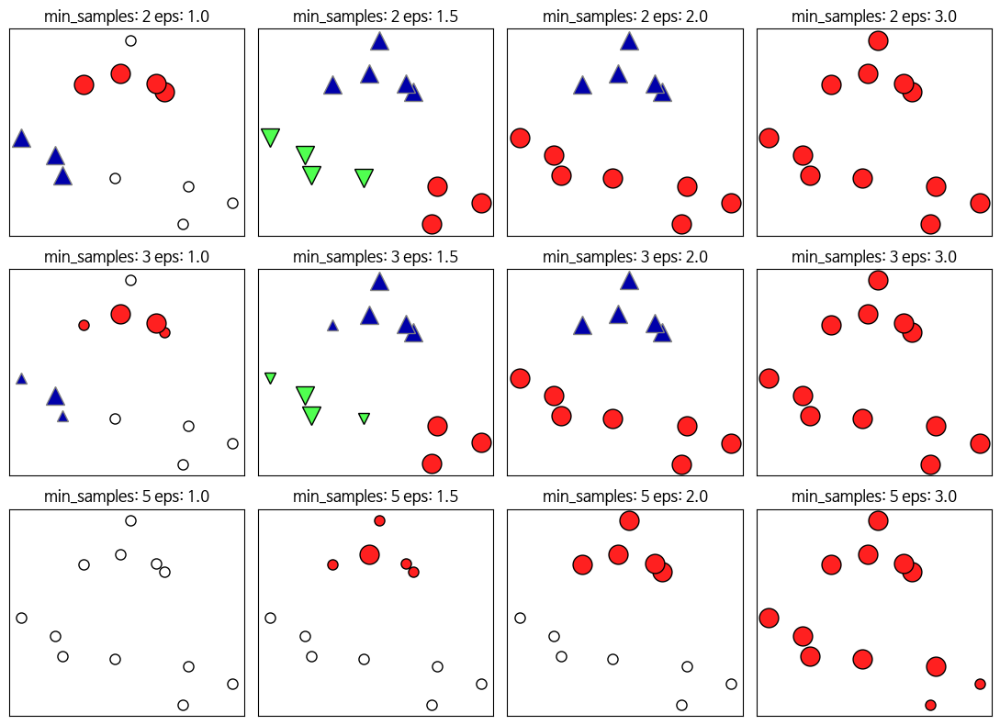

In [ ]:
mglearn.plots.plot_dbscan()
# 잡음 포인트는 흰색
# 핵심 포인트는 색상
# 경계 포인트는 작게 표현

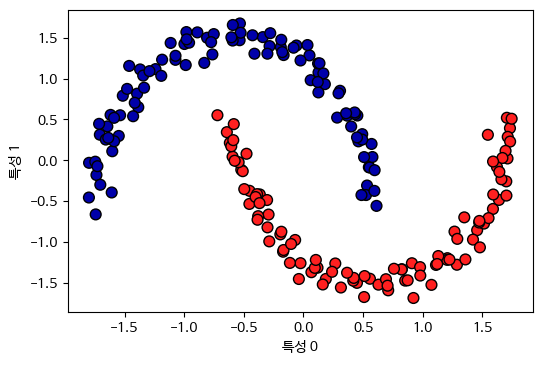

In [ ]:
# 두개의 반달 모양의 군집 식별 

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# 평균이 0, 분산이 1이 되도록 데이터의 스케일을 조정합니다
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X_scaled)
# 클러스터 할당을 표시합니다
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm2, s=60, edgecolors='black')
plt.xlabel("특성 0")
plt.ylabel("특성 1")
plt.show() # 책에는 없음

### 3.5.4 군집 알고리즘의 비교와 평가

- k-평균, 병합군집, DBSCAN 군집 알고리즘의 비교

#### 타겟값으로 군집 평가하기
- 군집 결과를 실제 정답 클러스터와 비교하여 평가할 수 있는 지표:: 최적일 때 1, 무작위일 때 0

  1) ARI(Adjusted Rand Index), 2) NMI(Normalized Mutual Information)

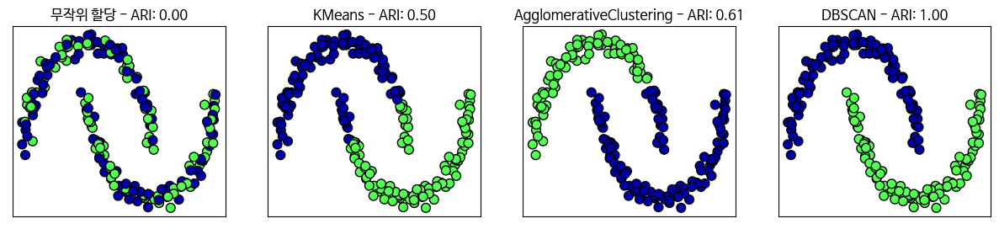

In [ ]:
# DBSCAN -ARI: 1.0

from sklearn.metrics.cluster import adjusted_rand_score
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# 평균이 0, 분산이 1이 되도록 데이터의 스케일을 조정합니다
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# 사용할 알고리즘 모델을 리스트로 만듭니다
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

# 비교를 위해 무작위로 클러스터 할당을 합니다
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# 무작위 할당한 클러스터를 그립니다
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60, edgecolors='black')
axes[0].set_title("무작위 할당 - ARI: {:.2f}".format(
        adjusted_rand_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
    # 클러스터 할당과 클러스터 중심을 그립니다
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters,
               cmap=mglearn.cm3, s=60, edgecolors='black')
    ax.set_title("{} - ARI: {:.2f}".format(algorithm.__class__.__name__,
                                           adjusted_rand_score(y, clusters)))

In [ ]:
# 군집 결과에 정확도 평가는 의미 없음 - 할당된 클러스터 레이블은 실행할 때마다 달라진다

from sklearn.metrics import accuracy_score

# 포인트가 클러스터로 나뉜 두 가지 경우
clusters1 = [0, 0, 1, 1, 0]
clusters2 = [1, 1, 0, 0, 1]
# 모든 레이블이 달라졌으므로 정확도는 0입니다
print("정확도: {:.2f}".format(accuracy_score(clusters1, clusters2)))
# 같은 포인트가 클러스터에 모였으므로 ARI는 1입니다
print("ARI: {:.2f}".format(adjusted_rand_score(clusters1, clusters2)))

정확도: 0.00
ARI: 1.00


#### 타겟값 없이 군집 평가하기

- target 값이 필요없는 군집용 지표: silhouette coefficient(실루엣 계수)

  > 클러스터의 밀집 정도를 계산, 최대 점수 1

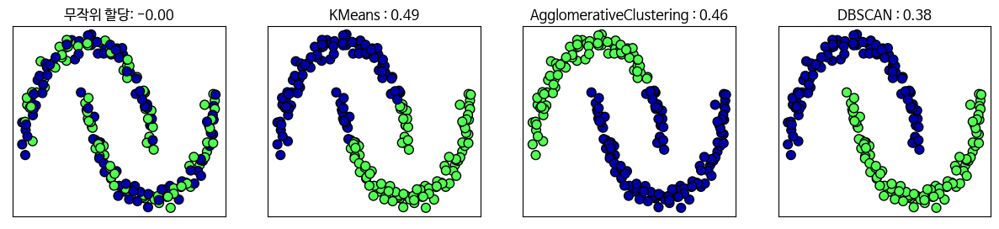

In [ ]:
# two-moons 데이터세트에서 실루엣 점수
## DBSCAN 군집이 k-평균보다 점수가 낮다

from sklearn.metrics.cluster import silhouette_score

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# 평균이 0, 분산이 1이 되도록 데이터의 스케일을 조정합니다
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# 비교를 위해 무작위로 클러스터 할당을 합니다
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# 무작위 할당한 클러스터를 그립니다
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60, edgecolors='black')
axes[0].set_title("무작위 할당: {:.2f}".format(
        silhouette_score(X_scaled, random_clusters)))

algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

for ax, algorithm in zip(axes[1:], algorithms):
    clusters = algorithm.fit_predict(X_scaled)
    # 클러스터 할당과 클러스터 중심을 그립니다
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3,
               s=60, edgecolors='black')
    ax.set_title("{} : {:.2f}".format(algorithm.__class__.__name__,
                                      silhouette_score(X_scaled, clusters)))

#### 얼굴 데이터셋으로 군집 알고리즘 비교

- 군집 결과가 어떤 유의미한 것이 있는지 알 수 없다 > 만들어진 군집 결과가 기대에 부합하는지 알 수 없다

  > 클러스터를 직접 눈으로 확인하는 방법

In [ ]:
# LFW 데이터에서 고유얼굴을 찾은 다음 데이터를 변환합니다
from sklearn.decomposition import PCA # 100개의 주성분을 군집 데이터로 활용
X_pca = pca.fit_transform(X_people)

#### DBSCAN으로 얼굴 데이터셋 분석

In [ ]:
# 기본 매개변수로 DBSCAN을 적용합니다
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("고유한 레이블:", np.unique(labels))# -1이므로 잡음 포인트로 간주

고유한 레이블: [-1]


In [ ]:
dbscan = DBSCAN(min_samples=3) # 증가시켜도
labels = dbscan.fit_predict(X_pca)
print("고유한 레이블:", np.unique(labels)) # -1이므로 잡음 포인트로 간주

고유한 레이블: [-1]


In [ ]:
dbscan = DBSCAN(min_samples=3, eps=15) #반경을 늘림
labels = dbscan.fit_predict(X_pca)
print("고유한 레이블:", np.unique(labels)) # 클러스터 1개, 잡음 포인트

고유한 레이블: [-1  0]


In [ ]:
# 잡음 포인트와 클러스터에 속한 포인트 수를 셉니다.
# bincount는 음수를 받을 수 없어서 labels에 1을 더했습니다.
# 반환값의 첫 번째 원소는 잡음 포인트의 수입니다.
print("클러스터별 포인트 수:", np.bincount(labels + 1))

클러스터별 포인트 수: [  37 2026]


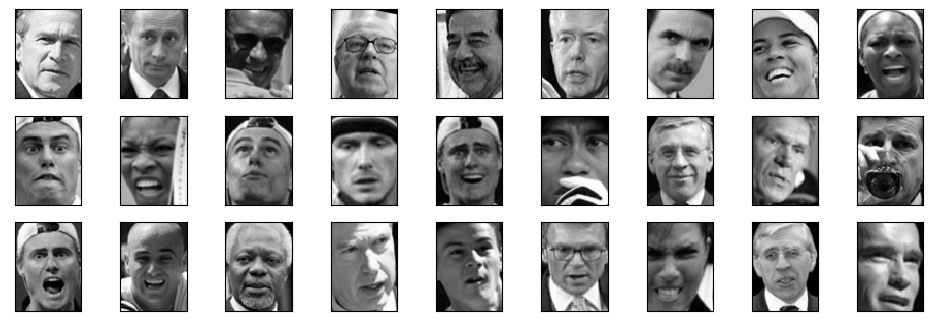

In [ ]:
# 잡음 포인트 직접 확인
#손, 모자, 잔 등이 얼굴에 나타남 > 이상치 검출(outlier detection)
noise = X_people[labels==-1]

fig, axes = plt.subplots(3, 9, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape))

In [ ]:
# eps: 0.5 ~ 15 변화에 따른 클러스터 결과

for eps in [1, 3, 5, 7, 9, 11, 13]:
    print("\neps=", eps)
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("클러스터 수:", len(np.unique(labels)))
    print("클러스터 크기:", np.bincount(labels + 1))


eps= 1
클러스터 수: 1
클러스터 크기: [2063]

eps= 3
클러스터 수: 1
클러스터 크기: [2063]

eps= 5
클러스터 수: 2
클러스터 크기: [2059    4]

eps= 7
클러스터 수: 7
클러스터 크기: [1957   75    4   14    6    4    3]

eps= 9
클러스터 수: 3
클러스터 크기: [1196  864    3]

eps= 11
클러스터 수: 2
클러스터 크기: [ 404 1659]

eps= 13
클러스터 수: 2
클러스터 크기: [ 119 1944]


- eps = 7 > 작은 클러스터들

- eps = 9 > 큰 클러스터 + 작은 클러스터

- eps = 11 > 큰 클러스터 1개

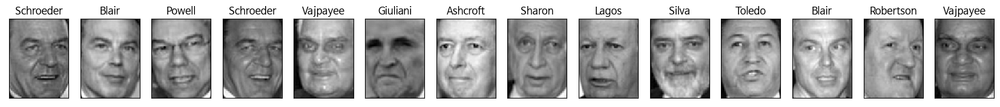

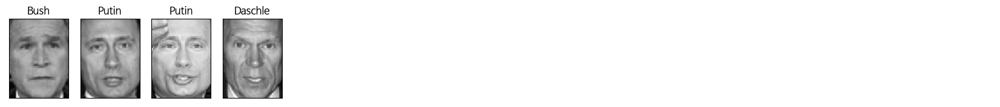

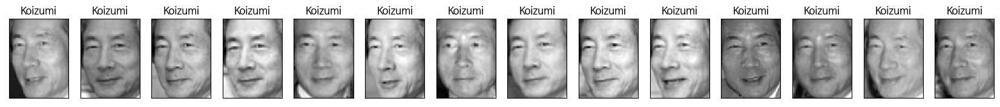

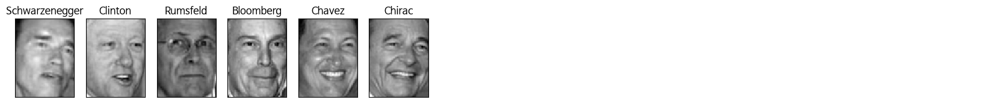

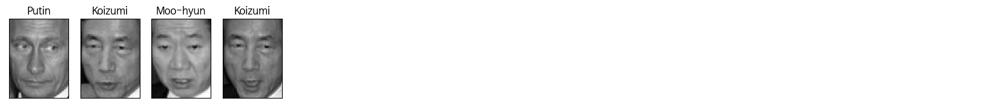

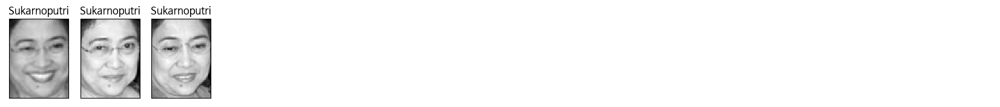

In [ ]:
# eps = 7 > 작은 클러스터들 13개를 시각화
## 얼굴 표정과 각도가 동일

dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images =  np.sum(mask)
    fig, axes = plt.subplots(1, 14, figsize=(14*1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})
    i = 0
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1])
        i += 1
    for j in range(len(axes) - i):
        axes[j+i].imshow(np.array([[1]*65]*87), vmin=0, vmax=1)
        axes[j+i].axis('off')

#### k-평균으로 얼굴 데이터셋 분석하기
- 비슷한 크기의 클러스터들을 만들 수 있다

- 클러스터 갯수를 지정해야 한다

In [ ]:
n_clusters = 10
# k-평균으로 클러스터를 추출합니다
km = KMeans(n_clusters=n_clusters, random_state=0)
labels_km = km.fit_predict(X_pca)
print("k-평균의 클러스터 크기:", np.bincount(labels_km))

k-평균의 클러스터 크기: [ 65 184 114  97 237 393 214 376 197 186]


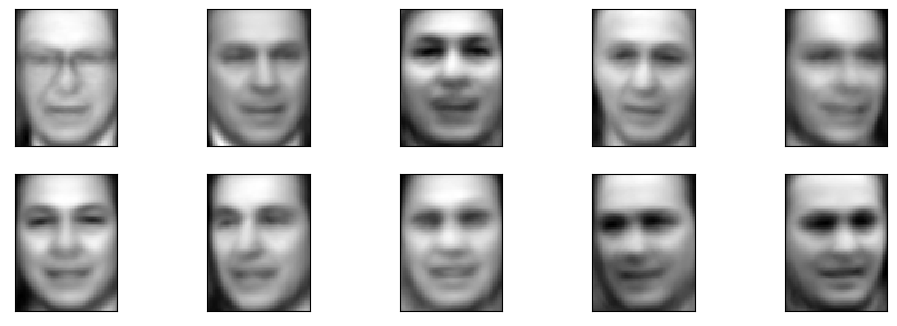

In [ ]:
# k-평균 클러스터 중심을 시각화 > 그림 3-43
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape)) # k-평균 의 클러스터 중심을 원본 공간으로 복원후 시각화

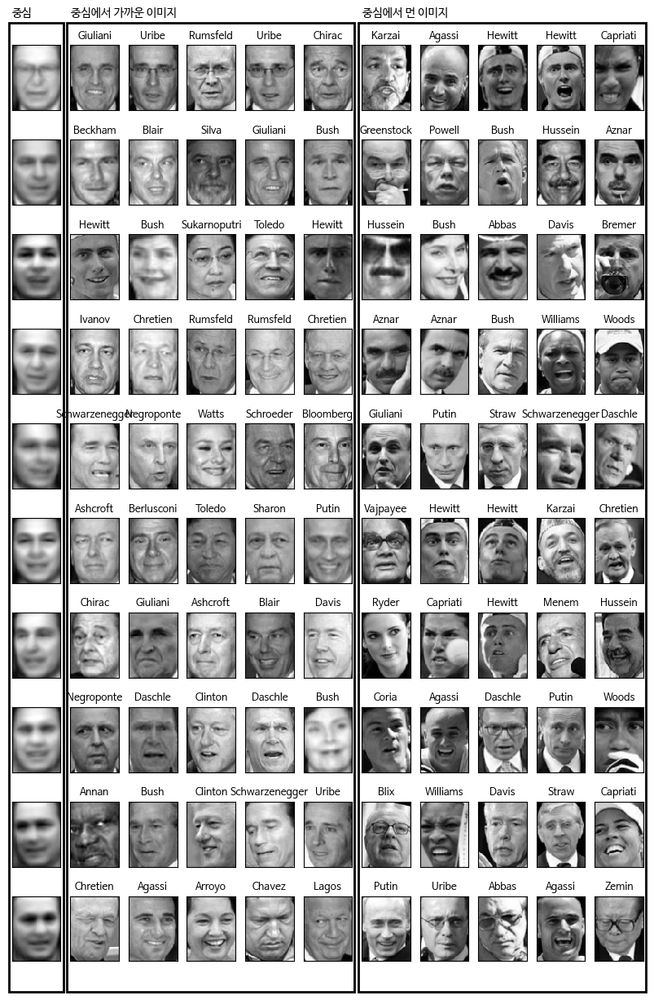

In [ ]:
# 각 클러스터에서 가장 대표되는 이미지 
# 클러스터 중심과 가장 동떨어진 이미지

mglearn.plots.plot_kmeans_faces(km, pca, X_pca, X_people,
                                y_people, people.target_names)

#### 병합 군집으로 얼굴 데이터셋 분석하기

In [ ]:
# 병합 군집으로 클러스터를 추출합니다
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("병합 군집의 클러스터 크기:",
       np.bincount(labels_agg))

병합 군집의 클러스터 크기: [ 56 101  94 140 154 596 269 178  61 414]


In [ ]:
# ARI 점수로 병합군집과 k-평균 유사도 측정

print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.08


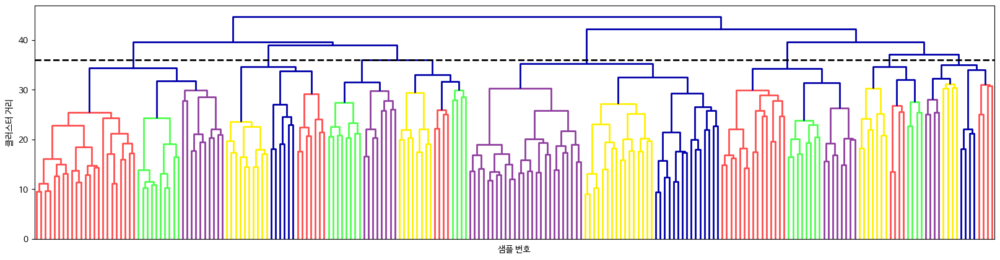

In [ ]:
linkage_array = ward(X_pca)
# 클러스터 사이의 거리가 담겨있는 linkage_array로 덴드로그램을 그립니다
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True) # root에서 7단계까지만 덴드로그램을 그린다
plt.xlabel("샘플 번호")
plt.ylabel("클러스터 거리")
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [36, 36], '--', c='k') # 수직선이 10개 되는 위치에서 잘라낸다 > 10개 클러스터

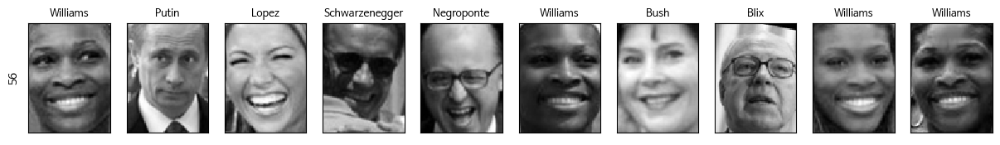

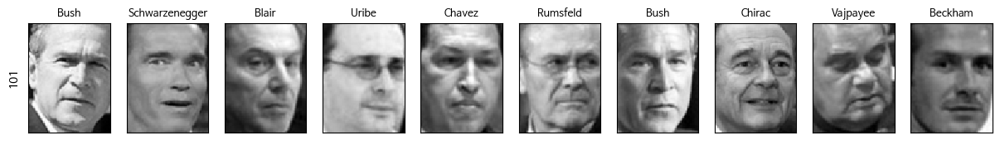

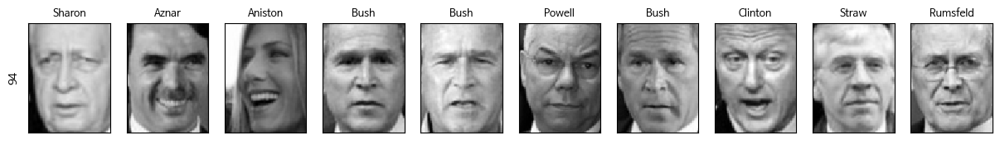

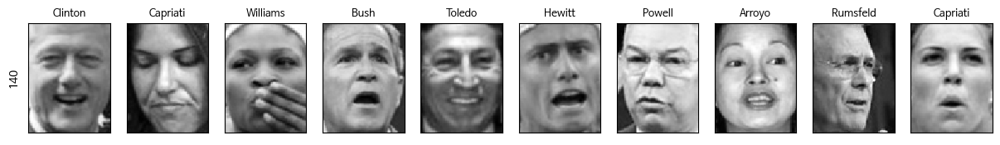

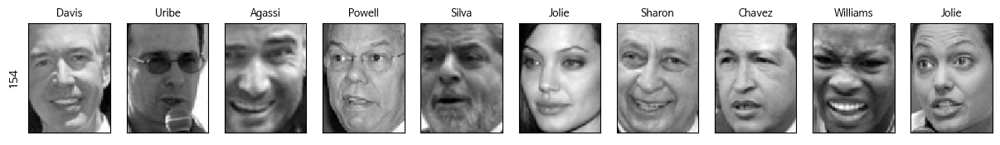

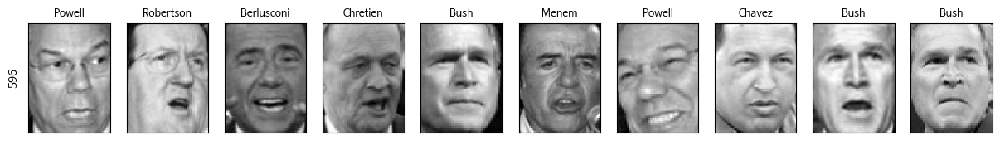

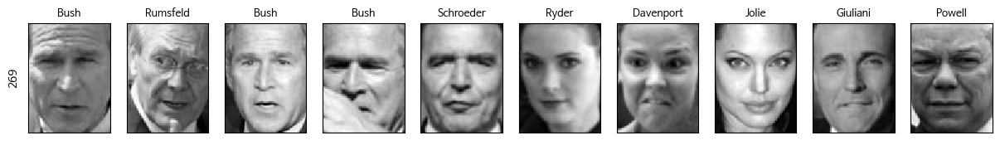

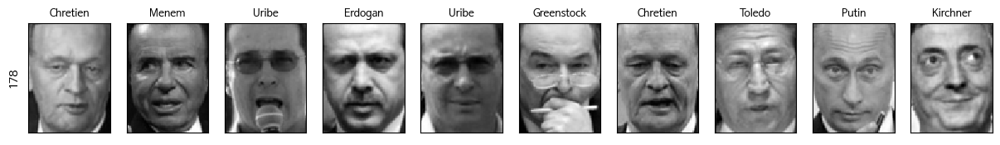

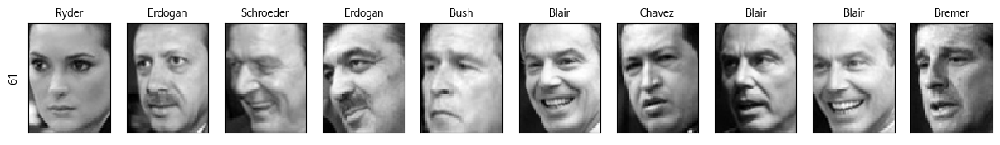

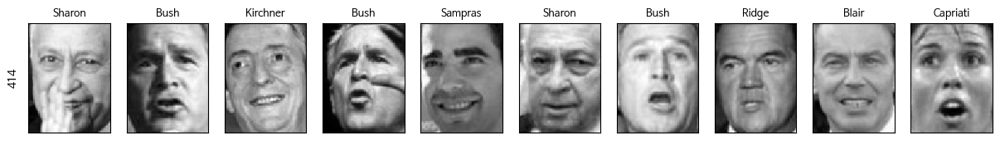

In [ ]:
# 10개 군집에 대한 시각화
## 다른 클러스터들은 일관성에 가지기에 클러스터가 너무 크다

n_clusters = 10
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})

병합 군집의 클러스터 크기: [268 151  44 129  23  63  19 101 116  13  66 102  51  40  30   2  74  44
  25  29  11  19 135  15  20  19  44  84  50  21  31   6   8   8  38  48
  19  66  27   4]


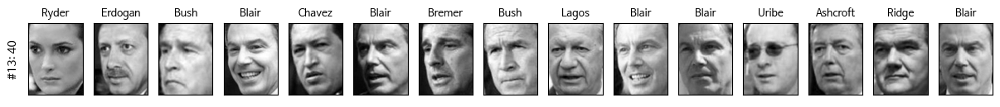

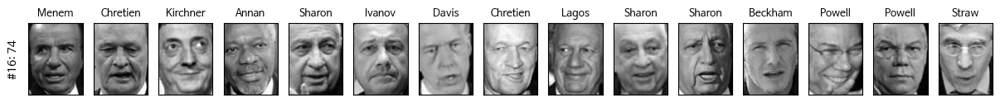

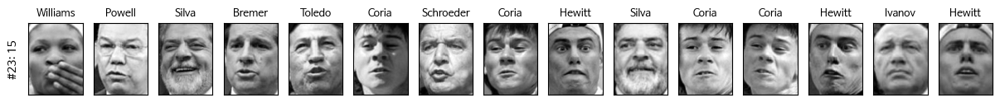

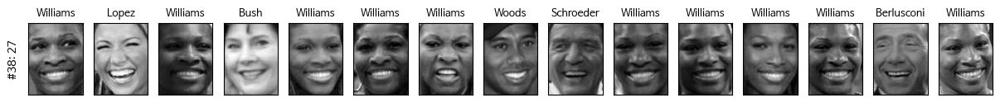

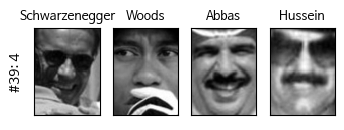

In [ ]:
# 병합 군집으로 클러스터를 추출합니다
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("병합 군집의 클러스터 크기:", np.bincount(labels_agg))

# 클러스터 갯수를 40개로 늘리다
## 대머리, 옆모습, 검은 피부색과 웃는 얼굴, 후세인 클러스터

n_clusters = 40
for cluster in [13, 16, 23, 38, 39]: # 흥미로운 클러스터 몇개를 골랐습니다
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

### 3.5.5 군집 알고리즘 요약

## 3.6 요약 및 정리

In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()